In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dl-final-dataset/y_train.pkl
/kaggle/input/dl-final-dataset/class_names.pkl
/kaggle/input/dl-final-dataset/X_test.npy
/kaggle/input/dl-final-dataset/X_val.npy
/kaggle/input/dl-final-dataset/X_train.npy
/kaggle/input/dl-final-dataset/y_test.pkl
/kaggle/input/dl-final-dataset/y_val.pkl


2025-11-26 07:54:12.696185: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764143652.887667      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764143652.949398      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

Loading preprocessed data...

Data loaded successfully!
Training set: (1220, 224, 224, 3)
Validation set: (250, 224, 224, 3)
Test set: (313, 224, 224, 3)
Number of classes: 4
Classes: ['Fox', 'Lion', 'Puma', 'Wolf']

Class distribution:

Training set:
  Fox: 305 samples
  Lion: 305 samples
  Puma: 305 samples
  Wolf: 305 samples

Validation set:
  Fox: 61 samples
  Lion: 76 samples
  Puma: 43 samples
  Wolf: 70 samples

Test set:
  Fox: 75 samples
  Lion: 96 samples
  Puma: 54 samples
  Wolf: 88 samples

Building DenseNet121-based model...


I0000 00:00:1764143673.526315      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "DenseNet121_Spectrogram_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_rotation     │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_zoom         │ (None, 224, 224,  │          0 │ random_rotation[… │
│ (RandomZoom)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast     │ (None, 224, 224,  │          0 │ random_zoom[0][0] │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise      │ (None, 224, 224,  │          0 │ random_contrast[… │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ gaussian_noise[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r

 Total params: 7,730,628 (29.49 MB)

 Trainable params: 7,645,188 (29.16 MB)

 Non-trainable params: 85,440 (333.75 KB)


Starting training...
Epoch 1/100


I0000 00:00:1764143763.577892     104 cuda_dnn.cc:529] Loaded cuDNN version 90300


39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.3723 - loss: 1.7205
Epoch 1: val_accuracy improved from -inf to 0.27200, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 117s 693ms/step - accuracy: 0.3742 - loss: 1.7151 - val_accuracy: 0.2720 - val_loss: 1.8083 - learning_rate: 5.0000e-04
Epoch 2/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.5520 - loss: 1.3192
Epoch 2: val_accuracy improved from 0.27200 to 0.39200, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 466ms/step - accuracy: 0.5526 - loss: 1.3166 - val_accuracy: 0.3920 - val_loss: 2.7241 - learning_rate: 5.0000e-04
Epoch 3/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.6304 - loss: 1.0206
Epoch 3: val_accuracy improved from 0.39200 to 0.56800, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 468ms/step - accuracy: 0.6314 - loss: 1.0185 - val_accuracy: 0.5680 - val_loss: 3.2381 - learning_rate: 5.0000e-04
Epoch 4/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.6800 - loss: 0.8848
Epoch 4: val_accuracy did not improve from 0.56800
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 434ms/step - accuracy: 0.6800 - loss: 0.8850 - val_accuracy: 0.3560 - val_loss: 8.7202 - learning_rate: 5.0000e-04
Epoch 5/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.6955 - loss: 0.8167
Epoch 5: val_accuracy did not improve from 0.56800
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.6954 - loss: 0.8166 - val_accuracy: 0.5200 - val_loss: 4.3008 - learning_rate: 5.0000e-04
Epoch 6/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.7435 - loss: 0.6904
Epoch 6: val_accuracy improved from 0.56800 to 0.62400, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 468ms/step - accuracy: 0.7438 - loss: 0.6902 - val_accuracy: 0.6240 - val_loss: 2.0335 - learning_rate: 5.0000e-04
Epoch 7/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.8050 - loss: 0.6028
Epoch 7: val_accuracy improved from 0.62400 to 0.66800, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 474ms/step - accuracy: 0.8042 - loss: 0.6037 - val_accuracy: 0.6680 - val_loss: 1.5345 - learning_rate: 5.0000e-04
Epoch 8/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.8127 - loss: 0.5509
Epoch 8: val_accuracy did not improve from 0.66800
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.8123 - loss: 0.5516 - val_accuracy: 0.4400 - val_loss: 5.2320 - learning_rate: 5.0000e-04
Epoch 9/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8255 - loss: 0.4876
Epoch 9: val_accuracy improved from 0.66800 to 0.69600, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 472ms/step - accuracy: 0.8253 - loss: 0.4886 - val_accuracy: 0.6960 - val_loss: 1.3454 - learning_rate: 5.0000e-04
Epoch 10/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.8303 - loss: 0.4819
Epoch 10: val_accuracy improved from 0.69600 to 0.73200, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 472ms/step - accuracy: 0.8301 - loss: 0.4820 - val_accuracy: 0.7320 - val_loss: 0.9269 - learning_rate: 5.0000e-04
Epoch 11/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.8857 - loss: 0.3563
Epoch 11: val_accuracy did not improve from 0.73200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 434ms/step - accuracy: 0.8849 - loss: 0.3577 - val_accuracy: 0.7280 - val_loss: 1.1040 - learning_rate: 5.0000e-04
Epoch 12/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8689 - loss: 0.3520
Epoch 12: val_accuracy did not improve from 0.73200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.8687 - loss: 0.3524 - val_accuracy: 0.6880 - val_loss: 1.7422 - learning_rate: 5.0000e-04
Epoch 13/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8831 - loss: 0.3356
Epoch 13: val_accuracy improved from 0.73200 to 0.74000, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 466ms/step - accuracy: 0.8829 - loss: 0.3363 - val_accuracy: 0.7400 - val_loss: 0.9997 - learning_rate: 5.0000e-04
Epoch 14/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8934 - loss: 0.2965
Epoch 14: val_accuracy improved from 0.74000 to 0.74400, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 468ms/step - accuracy: 0.8933 - loss: 0.2966 - val_accuracy: 0.7440 - val_loss: 0.9278 - learning_rate: 5.0000e-04
Epoch 15/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.8996 - loss: 0.2701
Epoch 15: val_accuracy improved from 0.74400 to 0.75600, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 472ms/step - accuracy: 0.8994 - loss: 0.2708 - val_accuracy: 0.7560 - val_loss: 0.9021 - learning_rate: 5.0000e-04
Epoch 16/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8950 - loss: 0.2910
Epoch 16: val_accuracy did not improve from 0.75600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.8946 - loss: 0.2916 - val_accuracy: 0.7280 - val_loss: 1.5797 - learning_rate: 5.0000e-04
Epoch 17/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8929 - loss: 0.3447
Epoch 17: val_accuracy did not improve from 0.75600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.8930 - loss: 0.3438 - val_accuracy: 0.6720 - val_loss: 1.9293 - learning_rate: 5.0000e-04
Epoch 18/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.9221 - loss: 0.2344
Epoch 18: val_accuracy did not improve from 0.75600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.9218 - loss: 0.2350 - val_accuracy: 0.6160 - val_loss: 2.1209 - learning_rate: 5.0000e

39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 472ms/step - accuracy: 0.9434 - loss: 0.1437 - val_accuracy: 0.7800 - val_loss: 0.5991 - learning_rate: 5.0000e-04
Epoch 26/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.9658 - loss: 0.1052
Epoch 26: val_accuracy did not improve from 0.78000
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 434ms/step - accuracy: 0.9656 - loss: 0.1057 - val_accuracy: 0.7480 - val_loss: 0.9828 - learning_rate: 5.0000e-04
Epoch 27/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.9589 - loss: 0.1648
Epoch 27: val_accuracy improved from 0.78000 to 0.81600, saving model to best_densenet121_spectrogram.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 469ms/step - accuracy: 0.9588 - loss: 0.1646 - val_accuracy: 0.8160 - val_loss: 0.6593 - learning_rate: 5.0000e-04
Epoch 28/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step - accuracy: 0.9557 - loss: 0.1260
Epoch 28: val_accuracy did not improve from 0.81600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 436ms/step - accuracy: 0.9557 - loss: 0.1262 - val_accuracy: 0.6720 - val_loss: 2.0530 - learning_rate: 5.0000e-04
Epoch 29/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.9671 - loss: 0.1045
Epoch 29: val_accuracy did not improve from 0.81600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 434ms/step - accuracy: 0.9670 - loss: 0.1052 - val_accuracy: 0.7640 - val_loss: 0.9579 - learning_rate: 5.0000e-04
Epoch 30/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.9739 - loss: 0.0849
Epoch 30: val_accuracy did not improve from 0.81600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.9738 - loss: 0.0852 - val_accuracy: 0.7240 - val_loss: 1.2228 - learning_rate: 5.0000e

39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 465ms/step - accuracy: 0.9978 - loss: 0.0100 - val_accuracy: 0.8280 - val_loss: 0.7874 - learning_rate: 1.2500e-04
Epoch 47/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 1.0000 - loss: 0.0076
Epoch 47: val_accuracy did not improve from 0.82800
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 1.0000 - loss: 0.0076 - val_accuracy: 0.8200 - val_loss: 0.7589 - learning_rate: 1.2500e-04
Epoch 48/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.9996 - loss: 0.0086
Epoch 48: val_accuracy did not improve from 0.82800
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.9996 - loss: 0.0087 - val_accuracy: 0.8160 - val_loss: 0.7726 - learning_rate: 1.2500e-04
Epoch 49/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.9996 - loss: 0.0076
Epoch 49: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.

Epoch 49: val_accuracy did not improve from 0.82800
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.9996 - lo

39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 467ms/step - accuracy: 0.9958 - loss: 0.0164 - val_accuracy: 0.8320 - val_loss: 0.7806 - learning_rate: 6.2500e-05
Epoch 50: early stopping
Restoring model weights from the end of the best epoch: 25.

Plotting training history...


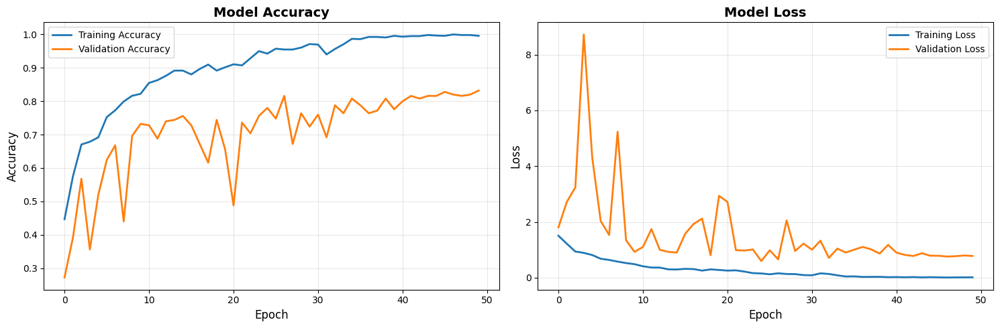


Evaluating on training set...
Test Loss: 0.1378
Test Accuracy: 0.9451

Evaluating on validation set...
Test Loss: 0.5991
Test Accuracy: 0.7800

Evaluating on test set...
Test Loss: 0.7747
Test Accuracy: 0.7700

Plotting comprehensive confusion matrices...


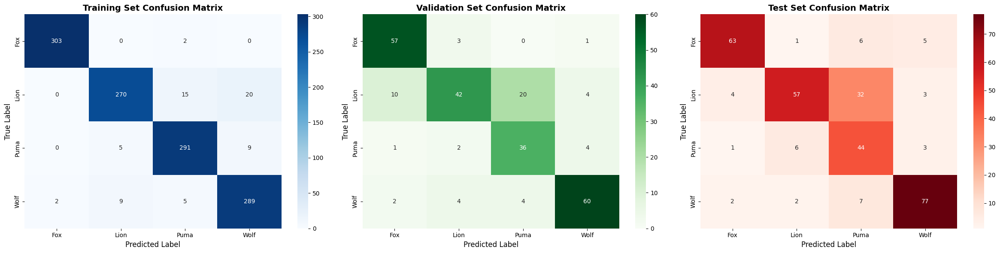


Generating comprehensive classification reports...
TRAINING SET CLASSIFICATION REPORT
              precision    recall  f1-score   support

         Fox     0.9934    0.9934    0.9934       305
        Lion     0.9507    0.8852    0.9168       305
        Puma     0.9297    0.9541    0.9417       305
        Wolf     0.9088    0.9475    0.9278       305

    accuracy                         0.9451      1220
   macro avg     0.9457    0.9451    0.9449      1220
weighted avg     0.9457    0.9451    0.9449      1220

VALIDATION SET CLASSIFICATION REPORT
              precision    recall  f1-score   support

         Fox     0.8143    0.9344    0.8702        61
        Lion     0.8235    0.5526    0.6614        76
        Puma     0.6000    0.8372    0.6990        43
        Wolf     0.8696    0.8571    0.8633        70

    accuracy                         0.7800       250
   macro avg     0.7768    0.7954    0.7735       250
weighted avg     0.7957    0.7800    0.7754       250

TEST S

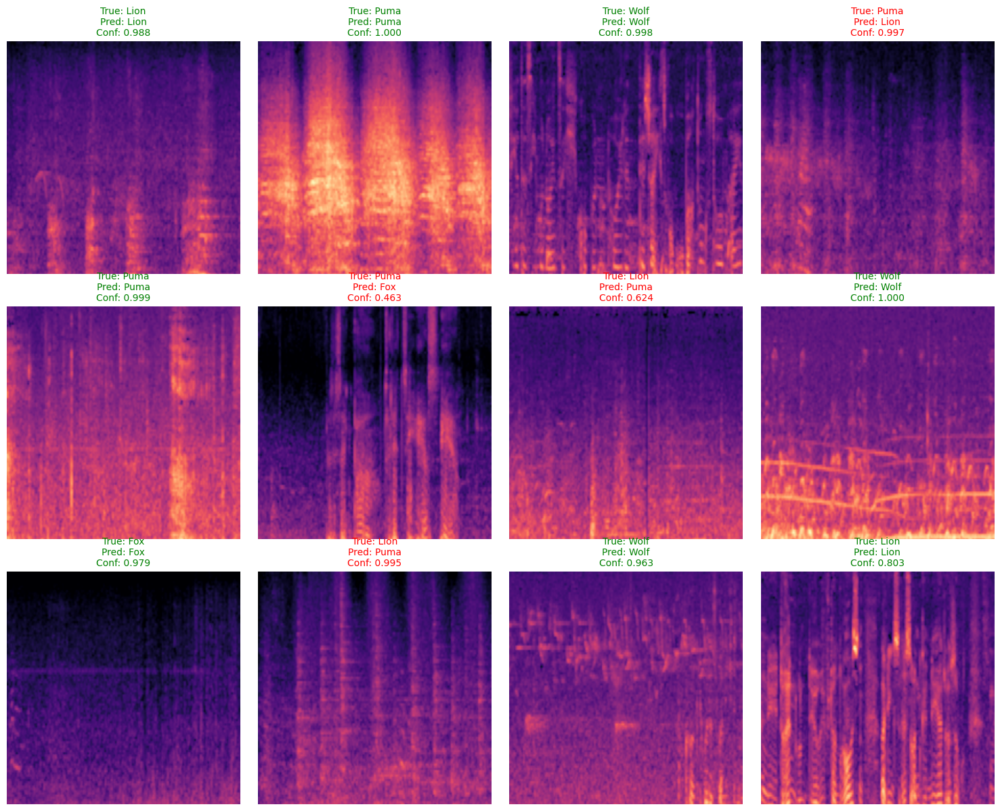


Analyzing misclassifications...



Top 10 Most Confident Misclassifications:
------------------------------------------------------------
True: Lion            Pred: Puma            Confidence: 0.9905
True: Lion            Pred: Puma            Confidence: 0.9913
True: Lion            Pred: Puma            Confidence: 0.9923
True: Lion            Pred: Puma            Confidence: 0.9924
True: Lion            Pred: Puma            Confidence: 0.9952
True: Puma            Pred: Lion            Confidence: 0.9965
True: Lion            Pred: Puma            Confidence: 0.9968
True: Lion            Pred: Puma            Confidence: 0.9973
True: Wolf            Pred: Puma            Confidence: 0.9983
True: Lion            Pred: Puma            Confidence: 0.9985

Final model saved as 'densenet121_spectrogram_final_model.h5'
Label mapping saved as 'label_mapping.pkl'


In [2]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.applications import DenseNet121
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import os
from sklearn.utils.class_weight import compute_class_weight

class DenseNet121SpectrogramClassifier:
    def __init__(self, input_shape, num_classes, use_imagenet_weights=True, freeze_base=False):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.use_imagenet_weights = use_imagenet_weights
        self.freeze_base = freeze_base
        self.model = None
        self.history = None
        self.class_weights = None
        
    def build_model(self):
        """
        Build DenseNet121-based model for spectrogram classification.
        Handles 1-channel or 3-channel input.
        """
        inputs = keras.Input(shape=self.input_shape)

        # Data augmentation
        x = layers.RandomRotation(0.1, fill_mode='constant')(inputs)
        x = layers.RandomZoom(0.1, fill_mode='constant')(x)
        x = layers.RandomContrast(0.1)(x)
        x = layers.GaussianNoise(0.01)(x)

        # If input is 1-channel (grayscale spectrogram), map to 3-channel for DenseNet
        if self.input_shape[-1] == 1:
            x = layers.Conv2D(3, (1, 1), padding='same', activation=None, name="channel_map_to_rgb")(x)

        # Choose weights
        weights = 'imagenet' if self.use_imagenet_weights else None

        # Base DenseNet121 model (feature extractor)
        base_model = DenseNet121(
            include_top=False,
            weights=weights,
            input_tensor=x,
            pooling='avg'
        )

        # Optionally freeze base
        base_model.trainable = not self.freeze_base

        x = base_model.output  # Already includes global average pooling via pooling='avg'

        # Classifier head
        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)

        x = layers.Dense(256, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.4)(x)

        x = layers.Dense(128, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.3)(x)

        # Output layer
        outputs = layers.Dense(self.num_classes, activation='softmax', dtype='float32')(x)

        model = keras.Model(inputs=inputs, outputs=outputs, name="DenseNet121_Spectrogram_Classifier")
        self.model = model
        return model
    
    def compile_model(self, learning_rate=0.0005):
        """
        Compile the model with Adam optimizer and gradient clipping.
        """
        if self.model is None:
            self.build_model()
            
        optimizer = keras.optimizers.Adam(
            learning_rate=learning_rate,
            clipnorm=1.0
        )
            
        self.model.compile(
            optimizer=optimizer,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
    
    def compute_class_weights(self, y_train):
        """
        Compute class weights for imbalanced data.
        """
        self.class_weights = compute_class_weight(
            'balanced',
            classes=np.unique(y_train),
            y=y_train
        )
        self.class_weights = dict(enumerate(self.class_weights))
        return self.class_weights
    
    def train(self, X_train, y_train, X_val, y_val, epochs=100, batch_size=32):
        """
        Train the DenseNet121-based model.
        """
        # Convert labels if needed
        if len(y_train.shape) > 1 and y_train.shape[1] > 1:
            y_train = np.argmax(y_train, axis=1)
        if len(y_val.shape) > 1 and y_val.shape[1] > 1:
            y_val = np.argmax(y_val, axis=1)
        
        # Ensure data types
        X_train = X_train.astype('float32')
        X_val = X_val.astype('float32')
        y_train = y_train.astype('int32')
        y_val = y_val.astype('int32')
        
        # Compute class weights if not done
        if self.class_weights is None:
            self.compute_class_weights(y_train)
        
        callbacks_list = [
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=25,
                restore_best_weights=True,
                verbose=1,
                min_delta=0.001
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=8,
                min_lr=1e-7,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                'best_densenet121_spectrogram.h5',
                monitor='val_accuracy',
                save_best_only=True,
                mode='max',
                verbose=1
            )
        ]
        
        self.history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=self.class_weights,
            verbose=1
        )
        
        return self.history
    
    def evaluate(self, X_test, y_test):
        """
        Evaluate the model.
        """
        if len(y_test.shape) > 1 and y_test.shape[1] > 1:
            y_test = np.argmax(y_test, axis=1)
            
        X_test = X_test.astype('float32')
        y_test = y_test.astype('int32')
        
        results = self.model.evaluate(X_test, y_test, verbose=0)
        
        print(f"Test Loss: {results[0]:.4f}")
        print(f"Test Accuracy: {results[1]:.4f}")
        
        return results[0], results[1]
    
    def predict(self, X):
        """
        Predict class probabilities and labels.
        """
        X = X.astype('float32')
        predictions = self.model.predict(X)
        return np.argmax(predictions, axis=1), predictions


def load_preprocessed_data(data_path="/kaggle/input/dl-final-dataset"):
    """
    Load preprocessed train/val/test spectrograms and labels.
    """
    try:
        X_train = np.load(os.path.join(data_path, 'X_train.npy'))
        X_val = np.load(os.path.join(data_path, 'X_val.npy'))
        X_test = np.load(os.path.join(data_path, 'X_test.npy'))
        
        with open(os.path.join(data_path, 'y_train.pkl'), 'rb') as f:
            y_train = pickle.load(f)
        with open(os.path.join(data_path, 'y_val.pkl'), 'rb') as f:
            y_val = pickle.load(f)
        with open(os.path.join(data_path, 'y_test.pkl'), 'rb') as f:
            y_test = pickle.load(f)
            
        with open(os.path.join(data_path, 'class_names.pkl'), 'rb') as f:
            class_names = pickle.load(f)
            
        return (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names
        
    except Exception as e:
        print(f"Error loading preprocessed data: {e}")
        return None, None, None, None


def plot_training_history(history):
    """
    Plot training & validation accuracy and loss.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend(fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


def plot_comprehensive_confusion_matrices(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    """
    Plot confusion matrices for train/val/test sets.
    """
    X_train = X_train.astype('float32')
    X_val = X_val.astype('float32')
    X_test = X_test.astype('float32')
    
    y_pred_train = model.predict(X_train, verbose=0)
    y_pred_train_classes = np.argmax(y_pred_train, axis=1)
    
    y_pred_val = model.predict(X_val, verbose=0)
    y_pred_val_classes = np.argmax(y_pred_val, axis=1)
    
    y_pred_test = model.predict(X_test, verbose=0)
    y_pred_test_classes = np.argmax(y_pred_test, axis=1)
    
    if len(y_train.shape) > 1 and y_train.shape[1] > 1:
        y_true_train = np.argmax(y_train, axis=1)
    else:
        y_true_train = y_train
        
    if len(y_val.shape) > 1 and y_val.shape[1] > 1:
        y_true_val = np.argmax(y_val, axis=1)
    else:
        y_true_val = y_val
        
    if len(y_test.shape) > 1 and y_test.shape[1] > 1:
        y_true_test = np.argmax(y_test, axis=1)
    else:
        y_true_test = y_test
    
    cm_train = confusion_matrix(y_true_train, y_pred_train_classes)
    cm_val = confusion_matrix(y_true_val, y_pred_val_classes)
    cm_test = confusion_matrix(y_true_test, y_pred_test_classes)
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_title('Training Set Confusion Matrix', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Predicted Label', fontsize=12)
    axes[0].set_ylabel('True Label', fontsize=12)
    
    sns.heatmap(cm_val, annot=True, fmt='d', cmap='Greens',
                xticklabels=class_names, yticklabels=class_names, ax=axes[1])
    axes[1].set_title('Validation Set Confusion Matrix', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Predicted Label', fontsize=12)
    axes[1].set_ylabel('True Label', fontsize=12)
    
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Reds',
                xticklabels=class_names, yticklabels=class_names, ax=axes[2])
    axes[2].set_title('Test Set Confusion Matrix', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Predicted Label', fontsize=12)
    axes[2].set_ylabel('True Label', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    return cm_train, cm_val, cm_test


def print_comprehensive_classification_reports(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    """
    Print classification reports for train/val/test sets.
    """
    X_train = X_train.astype('float32')
    X_val = X_val.astype('float32')
    X_test = X_test.astype('float32')
    
    y_pred_train = model.predict(X_train, verbose=0)
    y_pred_train_classes = np.argmax(y_pred_train, axis=1)
    
    y_pred_val = model.predict(X_val, verbose=0)
    y_pred_val_classes = np.argmax(y_pred_val, axis=1)
    
    y_pred_test = model.predict(X_test, verbose=0)
    y_pred_test_classes = np.argmax(y_pred_test, axis=1)
    
    if len(y_train.shape) > 1 and y_train.shape[1] > 1:
        y_true_train = np.argmax(y_train, axis=1)
    else:
        y_true_train = y_train
        
    if len(y_val.shape) > 1 and y_val.shape[1] > 1:
        y_true_val = np.argmax(y_val, axis=1)
    else:
        y_true_val = y_val
        
    if len(y_test.shape) > 1 and y_test.shape[1] > 1:
        y_true_test = np.argmax(y_test, axis=1)
    else:
        y_true_test = y_test
    
    print("="*80)
    print("TRAINING SET CLASSIFICATION REPORT")
    print("="*80)
    print(classification_report(y_true_train, y_pred_train_classes, target_names=class_names, digits=4))
    
    print("="*80)
    print("VALIDATION SET CLASSIFICATION REPORT")
    print("="*80)
    print(classification_report(y_true_val, y_pred_val_classes, target_names=class_names, digits=4))
    
    print("="*80)
    print("TEST SET CLASSIFICATION REPORT")
    print("="*80)
    print(classification_report(y_true_test, y_pred_test_classes, target_names=class_names, digits=4))


def plot_sample_predictions(model, X_test, y_test, class_names, num_samples=12):
    """
    Plot sample predictions with confidence scores.
    """
    X_test = X_test.astype('float32')
    
    y_pred = model.predict(X_test, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_pred_confidences = np.max(y_pred, axis=1)
    
    if len(y_test.shape) > 1 and y_test.shape[1] > 1:
        y_true_classes = np.argmax(y_test, axis=1)
    else:
        y_true_classes = y_test
    
    indices = np.random.choice(len(X_test), min(num_samples, len(X_test)), replace=False)
    
    fig, axes = plt.subplots(3, 4, figsize=(15, 12))
    axes = axes.ravel()
    
    for i, idx in enumerate(indices):
        if X_test[idx].shape[-1] == 1:
            axes[i].imshow(X_test[idx][:, :, 0], cmap='viridis')
        else:
            axes[i].imshow(X_test[idx])
        
        true_label = class_names[y_true_classes[idx]]
        pred_label = class_names[y_pred_classes[idx]]
        confidence = y_pred_confidences[idx]
        
        color = 'green' if true_label == pred_label else 'red'
        axes[i].set_title(
            f'True: {true_label}\nPred: {pred_label}\nConf: {confidence:.3f}', 
            color=color, fontsize=10
        )
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()


def analyze_misclassifications(model, X_test, y_test, class_names, top_k=10):
    """
    Analyze the most confident misclassifications.
    """
    X_test = X_test.astype('float32')
    
    y_pred = model.predict(X_test, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_pred_confidences = np.max(y_pred, axis=1)
    
    if len(y_test.shape) > 1 and y_test.shape[1] > 1:
        y_true_classes = np.argmax(y_test, axis=1)
    else:
        y_true_classes = y_test
    
    misclassified_indices = np.where(y_pred_classes != y_true_classes)[0]
    misclassified_confidences = y_pred_confidences[misclassified_indices]
    
    if len(misclassified_indices) > 0:
        top_misclassified = misclassified_indices[np.argsort(misclassified_confidences)[-top_k:]]
        
        print(f"\nTop {len(top_misclassified)} Most Confident Misclassifications:")
        print("-" * 60)
        
        for idx in top_misclassified:
            true_label = class_names[y_true_classes[idx]]
            pred_label = class_names[y_pred_classes[idx]]
            confidence = y_pred_confidences[idx]
            print(f"True: {true_label:15} Pred: {pred_label:15} Confidence: {confidence:.4f}")


def main():
    """
    Main function to train & evaluate DenseNet121 on animal sound spectrograms.
    """
    DATA_PATH = "/kaggle/input/dl-final-dataset"
    BATCH_SIZE = 32
    EPOCHS = 100
    LEARNING_RATE = 0.0005  # Slightly lower LR for DenseNet
    
    print("Loading preprocessed data...")
    (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names = load_preprocessed_data(DATA_PATH)
    
    if X_train is None:
        print("Failed to load data. Exiting...")
        return
    
    print(f"\nData loaded successfully!")
    print(f"Training set: {X_train.shape}")
    print(f"Validation set: {X_val.shape}")
    print(f"Test set: {X_test.shape}")
    print(f"Number of classes: {len(class_names)}")
    print(f"Classes: {class_names}")
    
    # Convert string labels to numeric IDs if needed
    label_to_id = {label: i for i, label in enumerate(class_names)}
    
    if isinstance(y_train[0], str):
        y_train = np.array([label_to_id[label] for label in y_train])
        y_val = np.array([label_to_id[label] for label in y_val])
        y_test = np.array([label_to_id[label] for label in y_test])
    
    print("\nClass distribution:")
    for dataset_name, dataset in [("Training", y_train), ("Validation", y_val), ("Test", y_test)]:
        unique, counts = np.unique(dataset, return_counts=True)
        print(f"\n{dataset_name} set:")
        for cls, count in zip(unique, counts):
            print(f"  {class_names[cls]}: {count} samples")
    
    print("\nBuilding DenseNet121-based model...")
    densenet_model = DenseNet121SpectrogramClassifier(
        input_shape=X_train[0].shape,
        num_classes=len(class_names),
        use_imagenet_weights=True,  # set False if you don't want pretraining
        freeze_base=False           # set True to fine-tune later
    )
    
    densenet_model.compile_model(learning_rate=LEARNING_RATE)
    
    densenet_model.model.summary()
    
    print("\nStarting training...")
    history = densenet_model.train(
        X_train, y_train,
        X_val, y_val,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE
    )
    
    print("\nPlotting training history...")
    plot_training_history(history)
    
    print("\nEvaluating on training set...")
    train_loss, train_accuracy = densenet_model.evaluate(X_train, y_train)
    
    print("\nEvaluating on validation set...")
    val_loss, val_accuracy = densenet_model.evaluate(X_val, y_val)
    
    print("\nEvaluating on test set...")
    test_loss, test_accuracy = densenet_model.evaluate(X_test, y_test)
    
    print("\nPlotting comprehensive confusion matrices...")
    plot_comprehensive_confusion_matrices(
        densenet_model.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )
    
    print("\nGenerating comprehensive classification reports...")
    print_comprehensive_classification_reports(
        densenet_model.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )
    
    print("\nPlotting sample predictions...")
    plot_sample_predictions(densenet_model.model, X_test, y_test, class_names)
    
    print("\nAnalyzing misclassifications...")
    analyze_misclassifications(densenet_model.model, X_test, y_test, class_names)
    
    # Save final model
    densenet_model.model.save('densenet121_spectrogram_final_model2.h5')
    print("\nFinal model saved as 'densenet121_spectrogram_final_model2.h5'")
    
    # Save label mapping
    label_mapping = {i: label for i, label in enumerate(class_names)}
    with open('label_mapping.pkl', 'wb') as f:
        pickle.dump(label_mapping, f)
    print("Label mapping saved as 'label_mapping.pkl'")


if __name__ == "__main__":
    np.random.seed(42)
    tf.random.set_seed(42)
    # Optionally enforce float32 (avoid mixed precision issues)
    # tf.keras.mixed_precision.set_global_policy('float32')
    
    main()


In [1]:
import os

file_path = "/kaggle/working/label_mapping.pkl"

print("Exists:", os.path.exists(file_path))
print("Size (bytes):", os.path.getsize(file_path))


Exists: False


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/label_mapping.pkl'

2025-11-26 09:21:24.718312: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764148884.908654      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764148884.965535      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

Loading dataset...

Dataset Loaded!
Train: (1220, 224, 224, 3), Val: (250, 224, 224, 3), Test: (313, 224, 224, 3)
Classes: ['Fox', 'Lion', 'Puma', 'Wolf']

Building DenseNet model...


I0000 00:00:1764148905.200032      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_rotation     │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_zoom         │ (None, 224, 224,  │          0 │ random_rotation[… │
│ (RandomZoom)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast     │ (None, 224, 224,  │          0 │ random_zoom[0][0] │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise      │ (None, 224, 224,  │          0 │ random_contrast[… │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ gaussian_noise[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r

 Total params: 7,730,628 (29.49 MB)

 Trainable params: 7,645,188 (29.16 MB)

 Non-trainable params: 85,440 (333.75 KB)


Training model...
Epoch 1/100


I0000 00:00:1764148992.017064     110 cuda_dnn.cc:529] Loaded cuDNN version 90300


39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.3878 - loss: 1.8494
Epoch 1: val_accuracy improved from -inf to 0.29200, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 114s 690ms/step - accuracy: 0.3896 - loss: 1.8430 - val_accuracy: 0.2920 - val_loss: 1.8170 - learning_rate: 5.0000e-04
Epoch 2/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.5667 - loss: 1.2622
Epoch 2: val_accuracy did not improve from 0.29200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.5670 - loss: 1.2612 - val_accuracy: 0.2760 - val_loss: 1.4936 - learning_rate: 5.0000e-04
Epoch 3/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.6066 - loss: 1.0850
Epoch 3: val_accuracy did not improve from 0.29200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 429ms/step - accuracy: 0.6066 - loss: 1.0854 - val_accuracy: 0.2560 - val_loss: 9.8858 - learning_rate: 5.0000e-04
Epoch 4/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.6947 - loss: 0.9069
Epoch 4: val_accuracy improved from 0.29200 to 0.59200, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 462ms/step - accuracy: 0.6944 - loss: 0.9071 - val_accuracy: 0.5920 - val_loss: 1.9863 - learning_rate: 5.0000e-04
Epoch 5/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.6991 - loss: 0.8056
Epoch 5: val_accuracy did not improve from 0.59200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 430ms/step - accuracy: 0.6991 - loss: 0.8059 - val_accuracy: 0.4440 - val_loss: 2.7689 - learning_rate: 5.0000e-04
Epoch 6/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.7417 - loss: 0.7287
Epoch 6: val_accuracy did not improve from 0.59200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 429ms/step - accuracy: 0.7416 - loss: 0.7293 - val_accuracy: 0.4480 - val_loss: 2.6705 - learning_rate: 5.0000e-04
Epoch 7/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.7639 - loss: 0.6549
Epoch 7: val_accuracy improved from 0.59200 to 0.68000, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 462ms/step - accuracy: 0.7637 - loss: 0.6557 - val_accuracy: 0.6800 - val_loss: 1.7839 - learning_rate: 5.0000e-04
Epoch 8/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.7967 - loss: 0.6008
Epoch 8: val_accuracy improved from 0.68000 to 0.75600, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 468ms/step - accuracy: 0.7963 - loss: 0.6014 - val_accuracy: 0.7560 - val_loss: 0.6307 - learning_rate: 5.0000e-04
Epoch 9/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.8085 - loss: 0.5142
Epoch 9: val_accuracy did not improve from 0.75600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 431ms/step - accuracy: 0.8084 - loss: 0.5148 - val_accuracy: 0.4560 - val_loss: 1.7163 - learning_rate: 5.0000e-04
Epoch 10/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.8274 - loss: 0.4669
Epoch 10: val_accuracy did not improve from 0.75600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 430ms/step - accuracy: 0.8270 - loss: 0.4683 - val_accuracy: 0.7400 - val_loss: 0.7090 - learning_rate: 5.0000e-04
Epoch 11/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.8374 - loss: 0.4313
Epoch 11: val_accuracy did not improve from 0.75600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 429ms/step - accuracy: 0.8373 - loss: 0.4316 - val_accuracy: 0.7320 - val_loss: 0.9913 - learning_rate: 5.0000e-0

39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 463ms/step - accuracy: 0.9480 - loss: 0.1318 - val_accuracy: 0.7880 - val_loss: 0.7348 - learning_rate: 2.5000e-04
Epoch 20/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.9480 - loss: 0.1498
Epoch 20: val_accuracy improved from 0.78800 to 0.79600, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 462ms/step - accuracy: 0.9479 - loss: 0.1501 - val_accuracy: 0.7960 - val_loss: 0.6843 - learning_rate: 2.5000e-04
Epoch 21/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.9533 - loss: 0.1120
Epoch 21: val_accuracy did not improve from 0.79600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 429ms/step - accuracy: 0.9532 - loss: 0.1125 - val_accuracy: 0.7280 - val_loss: 1.1105 - learning_rate: 2.5000e-04
Epoch 22/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.9748 - loss: 0.0838
Epoch 22: val_accuracy did not improve from 0.79600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 430ms/step - accuracy: 0.9748 - loss: 0.0839 - val_accuracy: 0.7400 - val_loss: 1.0161 - learning_rate: 2.5000e-04
Epoch 23/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.9725 - loss: 0.0788
Epoch 23: val_accuracy did not improve from 0.79600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 429ms/step - accuracy: 0.9724 - loss: 0.0790 - val_accuracy: 0.7000 - val_loss: 1.1700 - learning_rate: 2.5000e

39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 463ms/step - accuracy: 0.9833 - loss: 0.0483 - val_accuracy: 0.8160 - val_loss: 0.7599 - learning_rate: 1.2500e-04
Epoch 28/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.9887 - loss: 0.0368
Epoch 28: val_accuracy did not improve from 0.81600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 431ms/step - accuracy: 0.9886 - loss: 0.0370 - val_accuracy: 0.8040 - val_loss: 0.8207 - learning_rate: 1.2500e-04
Epoch 29/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.9934 - loss: 0.0285
Epoch 29: val_accuracy did not improve from 0.81600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 430ms/step - accuracy: 0.9933 - loss: 0.0288 - val_accuracy: 0.8080 - val_loss: 0.7663 - learning_rate: 1.2500e-04
Epoch 30/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.9904 - loss: 0.0406
Epoch 30: val_accuracy did not improve from 0.81600
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 431ms/step - accuracy: 0.9903 - loss: 0.0408 - val_accuracy: 0.7800 - val_loss: 1.0551 - learning_rate: 1.2500e

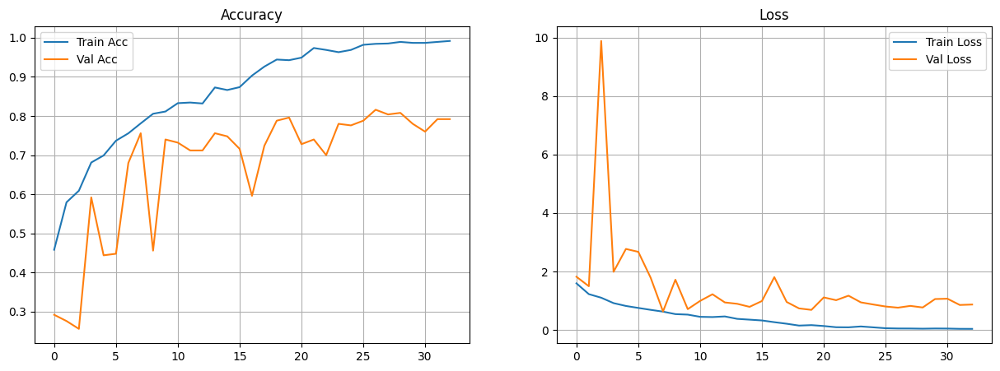


Evaluating performance...
Test Loss: 0.4647
Test Accuracy: 0.8139
Test Loss: 0.6307
Test Accuracy: 0.7560
Test Loss: 0.7770
Test Accuracy: 0.7508

Generating confusion matrices...


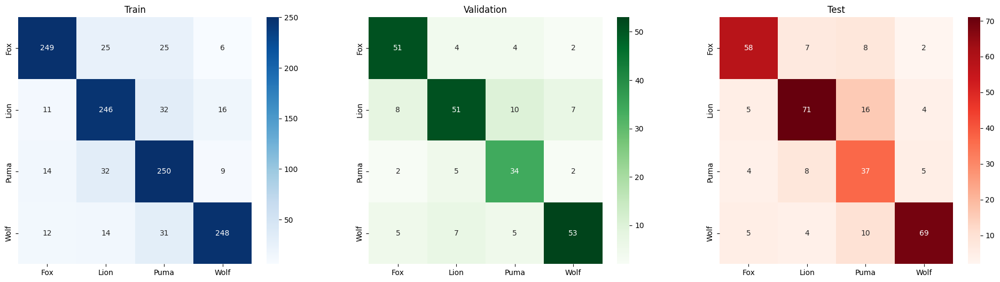


Classification reports...

=== TRAIN CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       0.87      0.82      0.84       305
        Lion       0.78      0.81      0.79       305
        Puma       0.74      0.82      0.78       305
        Wolf       0.89      0.81      0.85       305

    accuracy                           0.81      1220
   macro avg       0.82      0.81      0.82      1220
weighted avg       0.82      0.81      0.82      1220


=== VALIDATION CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       0.77      0.84      0.80        61
        Lion       0.76      0.67      0.71        76
        Puma       0.64      0.79      0.71        43
        Wolf       0.83      0.76      0.79        70

    accuracy                           0.76       250
   macro avg       0.75      0.76      0.75       250
weighted avg       0.76      0.76      0.76       250


=== TEST CLASSIFICATION

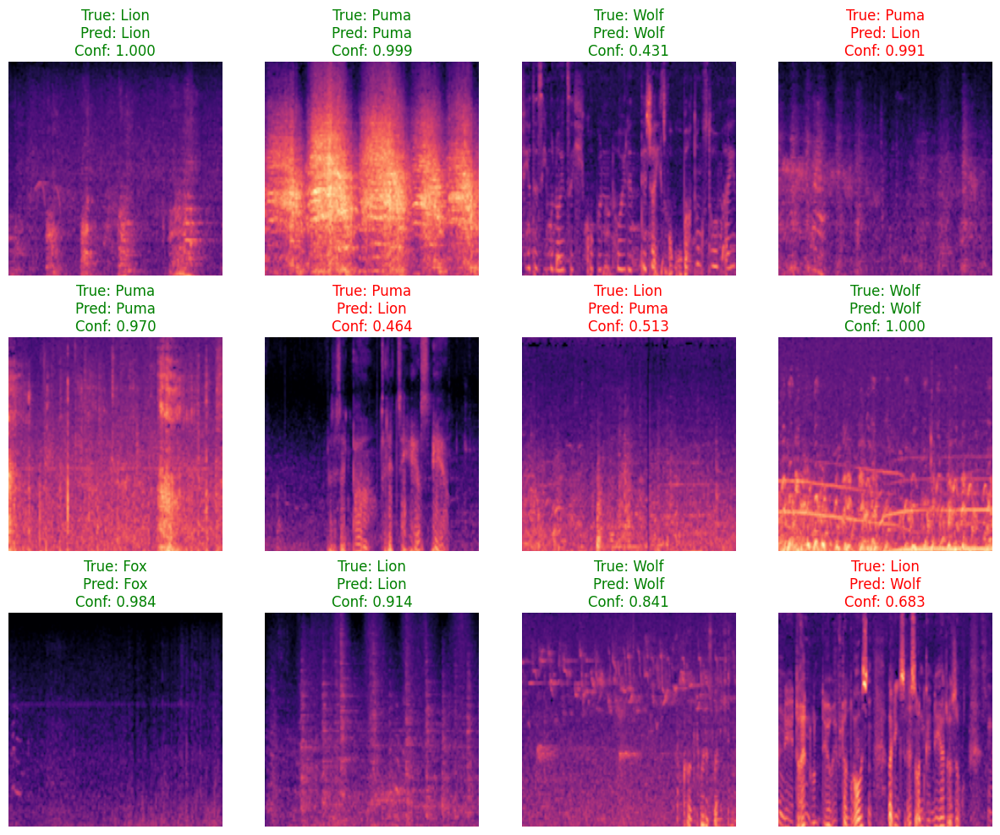


Analyzing misclassifications...



Top Confident Misclassifications:
True: Fox          Pred: Wolf         Conf: 0.9323
True: Fox          Pred: Puma         Conf: 0.9451
True: Lion         Pred: Puma         Conf: 0.9634
True: Puma         Pred: Lion         Conf: 0.9753
True: Puma         Pred: Wolf         Conf: 0.9887
True: Lion         Pred: Puma         Conf: 0.9898
True: Puma         Pred: Lion         Conf: 0.9906
True: Puma         Pred: Wolf         Conf: 0.9963
True: Lion         Pred: Puma         Conf: 0.9990
True: Lion         Pred: Puma         Conf: 0.9992

Saving final model...
Saved: densenet121_spectrogram_final_model_v2.h5
Saving label mapping...
Saved: label_mapping_v2.pkl


In [2]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.applications import DenseNet121
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import os
from sklearn.utils.class_weight import compute_class_weight

class DenseNet121SpectrogramClassifier:
    def __init__(self, input_shape, num_classes, use_imagenet_weights=True, freeze_base=False):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.use_imagenet_weights = use_imagenet_weights
        self.freeze_base = freeze_base
        self.model = None
        self.history = None
        self.class_weights = None
        
    def build_model(self):
        inputs = keras.Input(shape=self.input_shape)

        # Data Augmentation
        x = layers.RandomRotation(0.1, fill_mode='constant')(inputs)
        x = layers.RandomZoom(0.1, fill_mode='constant')(x)
        x = layers.RandomContrast(0.1)(x)
        x = layers.GaussianNoise(0.01)(x)

        # Convert grayscale → 3-channel for DenseNet
        if self.input_shape[-1] == 1:
            x = layers.Conv2D(3, (1, 1), padding='same', activation=None)(x)

        weights = 'imagenet' if self.use_imagenet_weights else None

        base_model = DenseNet121(
            include_top=False,
            weights=weights,
            input_tensor=x,
            pooling='avg'
        )

        base_model.trainable = not self.freeze_base

        x = base_model.output

        # Classifier Head
        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)

        x = layers.Dense(256, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.4)(x)

        x = layers.Dense(128, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.3)(x)

        outputs = layers.Dense(self.num_classes, activation='softmax', dtype='float32')(x)

        self.model = keras.Model(inputs=inputs, outputs=outputs)
        return self.model
    
    def compile_model(self, learning_rate=0.0005):
        if self.model is None:
            self.build_model()
            
        optimizer = keras.optimizers.Adam(
            learning_rate=learning_rate, 
            clipnorm=1.0
        )
        
        self.model.compile(
            optimizer=optimizer,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
    
    def compute_class_weights(self, y_train):
        self.class_weights = compute_class_weight(
            'balanced',
            classes=np.unique(y_train),
            y=y_train
        )
        self.class_weights = dict(enumerate(self.class_weights))
        return self.class_weights
    
    def train(self, X_train, y_train, X_val, y_val, epochs=100, batch_size=32):

        if len(y_train.shape) > 1 and y_train.shape[1] > 1:
            y_train = np.argmax(y_train, axis=1)
        if len(y_val.shape) > 1 and y_val.shape[1] > 1:
            y_val = np.argmax(y_val, axis=1)

        X_train = X_train.astype('float32')
        X_val = X_val.astype('float32')

        if self.class_weights is None:
            self.compute_class_weights(y_train)

        callbacks_list = [
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=25,
                restore_best_weights=True,
                min_delta=0.001,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=8,
                min_lr=1e-7,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                'best_densenet121_spectrogram_v2.h5',
                monitor='val_accuracy',
                save_best_only=True,
                mode='max',
                verbose=1
            )
        ]

        self.history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=self.class_weights,
            verbose=1
        )
        
        return self.history
    
    def evaluate(self, X_test, y_test):
        if len(y_test.shape) > 1 and y_test.shape[1] > 1:
            y_test = np.argmax(y_test, axis=1)

        X_test = X_test.astype('float32')
        y_test = y_test.astype('int32')

        results = self.model.evaluate(X_test, y_test, verbose=0)
        print(f"Test Loss: {results[0]:.4f}")
        print(f"Test Accuracy: {results[1]:.4f}")
        return results[0], results[1]
    
    def predict(self, X):
        X = X.astype('float32')
        preds = self.model.predict(X)
        return np.argmax(preds, axis=1), preds


def load_preprocessed_data(data_path="/kaggle/input/dl-final-dataset"):
    try:
        X_train = np.load(os.path.join(data_path, 'X_train.npy'))
        X_val = np.load(os.path.join(data_path, 'X_val.npy'))
        X_test = np.load(os.path.join(data_path, 'X_test.npy'))

        with open(os.path.join(data_path, 'y_train.pkl'), 'rb') as f:
            y_train = pickle.load(f)
        with open(os.path.join(data_path, 'y_val.pkl'), 'rb') as f:
            y_val = pickle.load(f)
        with open(os.path.join(data_path, 'y_test.pkl'), 'rb') as f:
            y_test = pickle.load(f)

        with open(os.path.join(data_path, 'class_names.pkl'), 'rb') as f:
            class_names = pickle.load(f)

        return (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names
    
    except Exception as e:
        print(f"ERROR loading data: {e}")
        return None, None, None, None


# === PLOTS, CONFUSION MATRICES, REPORTS REMAIN SAME === #
# (Keeping everything identical for your pipeline)

def plot_training_history(history):
    fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, 5))
    a1.plot(history.history['accuracy'], label='Train Acc')
    a1.plot(history.history['val_accuracy'], label='Val Acc')
    a1.legend()
    a1.set_title("Accuracy")
    a1.grid(True)

    a2.plot(history.history['loss'], label='Train Loss')
    a2.plot(history.history['val_loss'], label='Val Loss')
    a2.legend()
    a2.set_title("Loss")
    a2.grid(True)

    plt.show()


def plot_comprehensive_confusion_matrices(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train, X_val, X_test = X_train.astype('float32'), X_val.astype('float32'), X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    cm_train = confusion_matrix(y_train, p_train)
    cm_val = confusion_matrix(y_val, p_val)
    cm_test = confusion_matrix(y_test, p_test)

    fig, ax = plt.subplots(1, 3, figsize=(24, 6))
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=ax[0], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_val, annot=True, fmt='d', cmap='Greens', ax=ax[1], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Reds', ax=ax[2], xticklabels=class_names, yticklabels=class_names)
    ax[0].set_title("Train")
    ax[1].set_title("Validation")
    ax[2].set_title("Test")
    plt.show()

    return cm_train, cm_val, cm_test


def print_comprehensive_classification_reports(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train = X_train.astype('float32')
    X_val = X_val.astype('float32')
    X_test = X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    print("\n=== TRAIN CLASSIFICATION REPORT ===")
    print(classification_report(y_train, p_train, target_names=class_names))

    print("\n=== VALIDATION CLASSIFICATION REPORT ===")
    print(classification_report(y_val, p_val, target_names=class_names))

    print("\n=== TEST CLASSIFICATION REPORT ===")
    print(classification_report(y_test, p_test, target_names=class_names))


def plot_sample_predictions(model, X_test, y_test, class_names, num_samples=12):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    idxs = np.random.choice(len(X_test), min(num_samples, len(X_test)), replace=False)
    fig, axes = plt.subplots(3, 4, figsize=(15, 12))

    axes = axes.ravel()
    for i, idx in enumerate(idxs):
        axes[i].imshow(X_test[idx][:, :, 0] if X_test[idx].shape[-1] == 1 else X_test[idx], cmap='viridis')
        axes[i].set_title(f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}\nConf: {conf[idx]:.3f}",
                          color="green" if y_pred[idx] == y_true[idx] else "red")
        axes[i].axis('off')
    plt.show()


def analyze_misclassifications(model, X_test, y_test, class_names, top_k=10):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    wrong = np.where(y_pred != y_true)[0]
    wrong_conf = conf[wrong]

    if len(wrong) == 0:
        print("No misclassifications!")
        return

    top_wrong = wrong[np.argsort(wrong_conf)[-top_k:]]

    print("\nTop Confident Misclassifications:")
    for idx in top_wrong:
        print(f"True: {class_names[y_true[idx]]:<12} Pred: {class_names[y_pred[idx]]:<12} Conf: {conf[idx]:.4f}")


def main():

    DATA_PATH = "/kaggle/input/dl-final-dataset"
    BATCH_SIZE = 32
    EPOCHS = 100
    LR = 0.0005

    print("Loading dataset...")
    (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names = load_preprocessed_data(DATA_PATH)

    if X_train is None:
        print("DATA NOT FOUND — EXITING")
        return

    print("\nDataset Loaded!")
    print(f"Train: {X_train.shape}, Val: {X_val.shape}, Test: {X_test.shape}")
    print(f"Classes: {class_names}")

    # Convert string labels → numbers
    if isinstance(y_train[0], str):
        mapping = {c:i for i,c in enumerate(class_names)}
        y_train = np.array([mapping[y] for y in y_train])
        y_val = np.array([mapping[y] for y in y_val])
        y_test = np.array([mapping[y] for y in y_test])

    print("\nBuilding DenseNet model...")
    model_obj = DenseNet121SpectrogramClassifier(
        input_shape=X_train[0].shape,
        num_classes=len(class_names)
    )

    model_obj.compile_model(learning_rate=LR)
    model_obj.model.summary()

    print("\nTraining model...")
    history = model_obj.train(X_train, y_train, X_val, y_val, epochs=EPOCHS, batch_size=BATCH_SIZE)

    print("\nPlotting training curves...")
    plot_training_history(history)

    print("\nEvaluating performance...")
    model_obj.evaluate(X_train, y_train)
    model_obj.evaluate(X_val, y_val)
    model_obj.evaluate(X_test, y_test)

    print("\nGenerating confusion matrices...")
    plot_comprehensive_confusion_matrices(model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names)

    print("\nClassification reports...")
    print_comprehensive_classification_reports(model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names)

    print("\nSample predictions...")
    plot_sample_predictions(model_obj.model, X_test, y_test, class_names)

    print("\nAnalyzing misclassifications...")
    analyze_misclassifications(model_obj.model, X_test, y_test, class_names)

    print("\nSaving final model...")
    model_obj.model.save("densenet121_spectrogram_final_model_v2.h5")
    print("Saved: densenet121_spectrogram_final_model_v2.h5")

    print("Saving label mapping...")
    mapping = {i: c for i, c in enumerate(class_names)}
    with open("label_mapping_v2.pkl", "wb") as f:
        pickle.dump(mapping, f)
    print("Saved: label_mapping_v2.pkl")


if __name__ == "__main__":
    np.random.seed(42)
    tf.random.set_seed(42)

    main()


Loading dataset...

Dataset Loaded!
Train: (1220, 224, 224, 3), Val: (250, 224, 224, 3), Test: (313, 224, 224, 3)
Classes: ['Fox', 'Lion', 'Puma', 'Wolf']

Building DenseNet model...


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_rotation_1   │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_zoom_1       │ (None, 224, 224,  │          0 │ random_rotation_… │
│ (RandomZoom)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast_1   │ (None, 224, 224,  │          0 │ random_zoom_1[0]… │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_1    │ (None, 224, 224,  │          0 │ random_contrast_… │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ gaussian_noise_1… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r

 Total params: 7,730,628 (29.49 MB)

 Trainable params: 7,645,188 (29.16 MB)

 Non-trainable params: 85,440 (333.75 KB)


Training model...
Epoch 1/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.3450 - loss: 1.8506
Epoch 1: val_accuracy improved from -inf to 0.28400, saving model to best_densenet121_spectrogram_v2.h5


77/77 ━━━━━━━━━━━━━━━━━━━━ 113s 364ms/step - accuracy: 0.3456 - loss: 1.8487 - val_accuracy: 0.2840 - val_loss: 71.6750 - learning_rate: 0.0010
Epoch 2/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.4526 - loss: 1.4841
Epoch 2: val_accuracy improved from 0.28400 to 0.29600, saving model to best_densenet121_spectrogram_v2.h5


77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 281ms/step - accuracy: 0.4521 - loss: 1.4847 - val_accuracy: 0.2960 - val_loss: 375.5707 - learning_rate: 0.0010
Epoch 3/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.4664 - loss: 1.3741
Epoch 3: val_accuracy did not improve from 0.29600
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 267ms/step - accuracy: 0.4663 - loss: 1.3742 - val_accuracy: 0.2680 - val_loss: 29.7651 - learning_rate: 0.0010
Epoch 4/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.4804 - loss: 1.2566
Epoch 4: val_accuracy improved from 0.29600 to 0.48800, saving model to best_densenet121_spectrogram_v2.h5


77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 283ms/step - accuracy: 0.4803 - loss: 1.2566 - val_accuracy: 0.4880 - val_loss: 3.2543 - learning_rate: 0.0010
Epoch 5/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.5136 - loss: 1.1848
Epoch 5: val_accuracy did not improve from 0.48800
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - accuracy: 0.5141 - loss: 1.1841 - val_accuracy: 0.4280 - val_loss: 2.6490 - learning_rate: 0.0010
Epoch 6/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.5330 - loss: 1.1660
Epoch 6: val_accuracy did not improve from 0.48800
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 263ms/step - accuracy: 0.5330 - loss: 1.1662 - val_accuracy: 0.4880 - val_loss: 4.0221 - learning_rate: 0.0010
Epoch 7/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.5669 - loss: 1.0617
Epoch 7: val_accuracy improved from 0.48800 to 0.61200, saving model to best_densenet121_spectrogram_v2.h5


77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 285ms/step - accuracy: 0.5670 - loss: 1.0614 - val_accuracy: 0.6120 - val_loss: 1.1298 - learning_rate: 0.0010
Epoch 8/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.6248 - loss: 0.9242
Epoch 8: val_accuracy improved from 0.61200 to 0.69200, saving model to best_densenet121_spectrogram_v2.h5


77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 287ms/step - accuracy: 0.6248 - loss: 0.9242 - val_accuracy: 0.6920 - val_loss: 0.8848 - learning_rate: 0.0010
Epoch 9/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7022 - loss: 0.7854
Epoch 9: val_accuracy did not improve from 0.69200
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - accuracy: 0.7020 - loss: 0.7861 - val_accuracy: 0.5480 - val_loss: 1.4963 - learning_rate: 0.0010
Epoch 10/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7077 - loss: 0.7642
Epoch 10: val_accuracy did not improve from 0.69200
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - accuracy: 0.7077 - loss: 0.7643 - val_accuracy: 0.6280 - val_loss: 1.1711 - learning_rate: 0.0010
Epoch 11/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7157 - loss: 0.7167
Epoch 11: val_accuracy did not improve from 0.69200
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 265ms/step - accuracy: 0.7154 - loss: 0.7174 - val_accuracy: 0.6040 - val_loss: 1.7384 - learning_rate: 0.0010
Epoch 12/100
7

77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 283ms/step - accuracy: 0.7636 - loss: 0.6159 - val_accuracy: 0.7120 - val_loss: 0.7658 - learning_rate: 0.0010
Epoch 16/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7925 - loss: 0.5784
Epoch 16: val_accuracy did not improve from 0.71200
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.7922 - loss: 0.5790 - val_accuracy: 0.6480 - val_loss: 1.1507 - learning_rate: 0.0010
Epoch 17/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.8028 - loss: 0.5255
Epoch 17: val_accuracy did not improve from 0.71200
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 265ms/step - accuracy: 0.8024 - loss: 0.5262 - val_accuracy: 0.4720 - val_loss: 1.7992 - learning_rate: 0.0010
Epoch 18/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.8031 - loss: 0.5323
Epoch 18: val_accuracy did not improve from 0.71200
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 265ms/step - accuracy: 0.8028 - loss: 0.5329 - val_accuracy: 0.7000 - val_loss: 1.1466 - learning_rate: 0.0010
Epoch 19/100

77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - accuracy: 0.8399 - loss: 0.4663 - val_accuracy: 0.7160 - val_loss: 0.7164 - learning_rate: 0.0010
Epoch 22/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.8265 - loss: 0.4893
Epoch 22: val_accuracy did not improve from 0.71600
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.8263 - loss: 0.4897 - val_accuracy: 0.7160 - val_loss: 0.7875 - learning_rate: 0.0010
Epoch 23/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.8092 - loss: 0.5054
Epoch 23: val_accuracy did not improve from 0.71600
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.8090 - loss: 0.5060 - val_accuracy: 0.5880 - val_loss: 1.6400 - learning_rate: 0.0010
Epoch 24/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.8482 - loss: 0.4541
Epoch 24: val_accuracy did not improve from 0.71600
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 265ms/step - accuracy: 0.8479 - loss: 0.4546 - val_accuracy: 0.7040 - val_loss: 1.0572 - learning_rate: 0.0010
Epoch 25/100

77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - accuracy: 0.8302 - loss: 0.4664 - val_accuracy: 0.7360 - val_loss: 0.7667 - learning_rate: 0.0010
Epoch 26/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.8524 - loss: 0.4111
Epoch 26: val_accuracy did not improve from 0.73600
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.8521 - loss: 0.4120 - val_accuracy: 0.7120 - val_loss: 0.8941 - learning_rate: 0.0010
Epoch 27/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.8253 - loss: 0.4663
Epoch 27: val_accuracy did not improve from 0.73600
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.8253 - loss: 0.4667 - val_accuracy: 0.6880 - val_loss: 0.7913 - learning_rate: 0.0010
Epoch 28/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.8289 - loss: 0.4297
Epoch 28: val_accuracy did not improve from 0.73600
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.8288 - loss: 0.4299 - val_accuracy: 0.6960 - val_loss: 0.8864 - learning_rate: 0.0010
Epoch 29/100

77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - accuracy: 0.8570 - loss: 0.3867 - val_accuracy: 0.7800 - val_loss: 0.5650 - learning_rate: 5.0000e-04
Epoch 31/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.8855 - loss: 0.3202
Epoch 31: val_accuracy improved from 0.78000 to 0.78800, saving model to best_densenet121_spectrogram_v2.h5


77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - accuracy: 0.8853 - loss: 0.3206 - val_accuracy: 0.7880 - val_loss: 0.5465 - learning_rate: 5.0000e-04
Epoch 32/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9133 - loss: 0.2686
Epoch 32: val_accuracy did not improve from 0.78800
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9130 - loss: 0.2690 - val_accuracy: 0.7360 - val_loss: 0.7154 - learning_rate: 5.0000e-04
Epoch 33/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9161 - loss: 0.2615
Epoch 33: val_accuracy did not improve from 0.78800
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9159 - loss: 0.2618 - val_accuracy: 0.7320 - val_loss: 0.8147 - learning_rate: 5.0000e-04
Epoch 34/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9080 - loss: 0.2366
Epoch 34: val_accuracy did not improve from 0.78800
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9079 - loss: 0.2368 - val_accuracy: 0.7240 - val_loss: 1.0931 - learning_rate: 5.0000e

77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - accuracy: 0.9246 - loss: 0.2170 - val_accuracy: 0.8080 - val_loss: 0.6007 - learning_rate: 5.0000e-04
Epoch 37/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9165 - loss: 0.2390
Epoch 37: val_accuracy did not improve from 0.80800
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9164 - loss: 0.2393 - val_accuracy: 0.8080 - val_loss: 0.7257 - learning_rate: 5.0000e-04
Epoch 38/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9302 - loss: 0.2045
Epoch 38: val_accuracy did not improve from 0.80800
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9300 - loss: 0.2049 - val_accuracy: 0.7160 - val_loss: 1.0340 - learning_rate: 5.0000e-04
Epoch 39/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.9269 - loss: 0.2369
Epoch 39: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 39: val_accuracy did not improve from 0.80800
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9267 - l

77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 282ms/step - accuracy: 0.9336 - loss: 0.1876 - val_accuracy: 0.8200 - val_loss: 0.5452 - learning_rate: 2.5000e-04
Epoch 41/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9577 - loss: 0.1411
Epoch 41: val_accuracy did not improve from 0.82000
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9575 - loss: 0.1415 - val_accuracy: 0.7800 - val_loss: 0.7747 - learning_rate: 2.5000e-04
Epoch 42/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9571 - loss: 0.1390
Epoch 42: val_accuracy did not improve from 0.82000
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9570 - loss: 0.1392 - val_accuracy: 0.7520 - val_loss: 0.8993 - learning_rate: 2.5000e-04
Epoch 43/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9589 - loss: 0.1086
Epoch 43: val_accuracy did not improve from 0.82000
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9589 - loss: 0.1086 - val_accuracy: 0.7840 - val_loss: 0.7944 - learning_rate: 2.5000e

77/77 ━━━━━━━━━━━━━━━━━━━━ 22s 281ms/step - accuracy: 0.9762 - loss: 0.0596 - val_accuracy: 0.8240 - val_loss: 0.7621 - learning_rate: 1.2500e-04
Epoch 51/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9832 - loss: 0.0628
Epoch 51: val_accuracy did not improve from 0.82400
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9831 - loss: 0.0629 - val_accuracy: 0.7760 - val_loss: 1.0476 - learning_rate: 1.2500e-04
Epoch 52/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9799 - loss: 0.0656
Epoch 52: val_accuracy did not improve from 0.82400
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9798 - loss: 0.0656 - val_accuracy: 0.7720 - val_loss: 0.9046 - learning_rate: 1.2500e-04
Epoch 53/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9846 - loss: 0.0591
Epoch 53: val_accuracy did not improve from 0.82400
77/77 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.9845 - loss: 0.0592 - val_accuracy: 0.7720 - val_loss: 0.9324 - learning_rate: 1.2500e

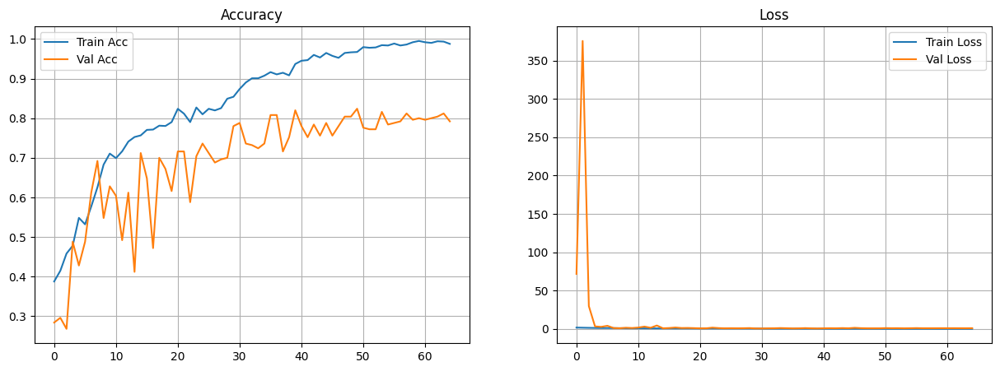


Evaluating performance...
Test Loss: 0.1177
Test Accuracy: 0.9598
Test Loss: 0.5452
Test Accuracy: 0.8200
Test Loss: 0.7165
Test Accuracy: 0.7700

Generating confusion matrices...


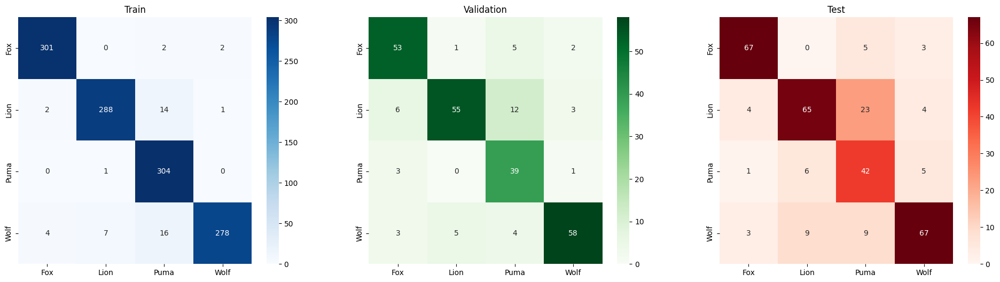


Classification reports...

=== TRAIN CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       0.98      0.99      0.98       305
        Lion       0.97      0.94      0.96       305
        Puma       0.90      1.00      0.95       305
        Wolf       0.99      0.91      0.95       305

    accuracy                           0.96      1220
   macro avg       0.96      0.96      0.96      1220
weighted avg       0.96      0.96      0.96      1220


=== VALIDATION CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       0.82      0.87      0.84        61
        Lion       0.90      0.72      0.80        76
        Puma       0.65      0.91      0.76        43
        Wolf       0.91      0.83      0.87        70

    accuracy                           0.82       250
   macro avg       0.82      0.83      0.82       250
weighted avg       0.84      0.82      0.82       250


=== TEST CLASSIFICATION

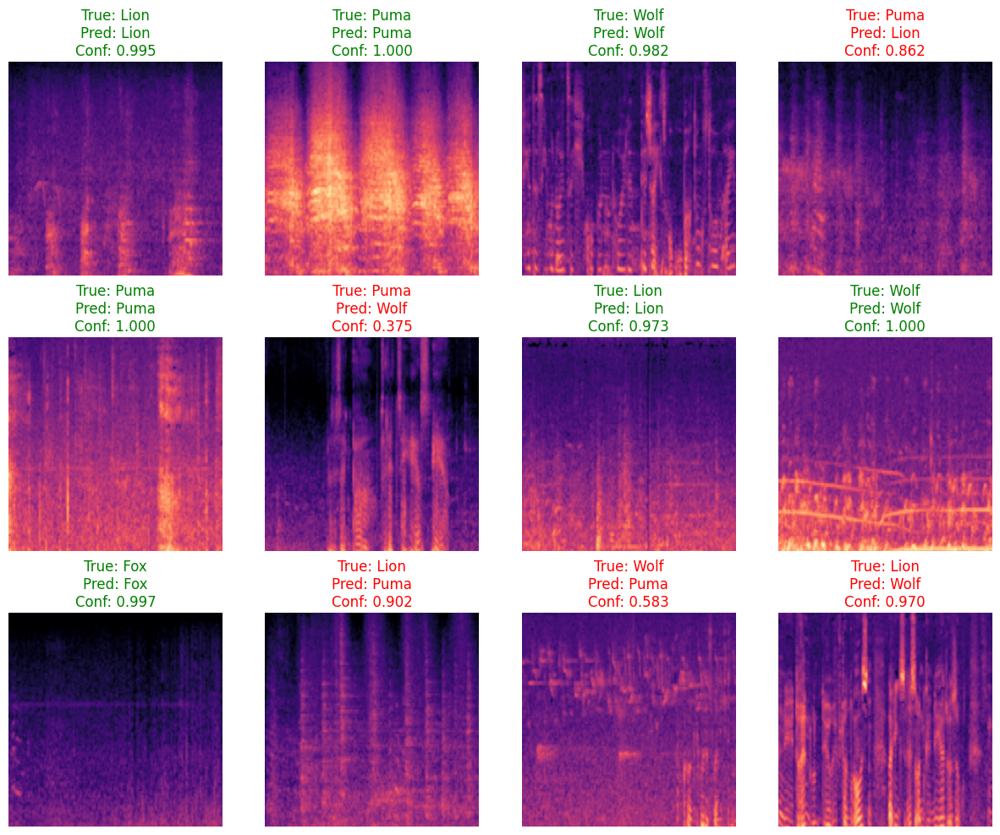


Analyzing misclassifications...



Top Confident Misclassifications:
True: Wolf         Pred: Puma         Conf: 0.9802
True: Wolf         Pred: Lion         Conf: 0.9845
True: Wolf         Pred: Fox          Conf: 0.9882
True: Lion         Pred: Fox          Conf: 0.9887
True: Wolf         Pred: Fox          Conf: 0.9895
True: Lion         Pred: Puma         Conf: 0.9911
True: Puma         Pred: Lion         Conf: 0.9912
True: Lion         Pred: Fox          Conf: 0.9963
True: Lion         Pred: Puma         Conf: 0.9998
True: Lion         Pred: Puma         Conf: 0.9999

Saving final model...
Saved: densenet121_spectrogram_final_model_v2.h5
Saving label mapping...
Saved: label_mapping_v2.pkl


In [2]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.applications import DenseNet121
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import os
from sklearn.utils.class_weight import compute_class_weight


# ================================================================
# ABLATION PARAMETERS — CHANGE THESE ONLY FOR EXPERIMENTS
# ================================================================
ABLATION_CONFIG = {
    "learning_rate": 1e-3,     # Try values: 1e-3, 5e-4, 1e-4, 1e-5
    "batch_size": 16,            # Try values: 16, 32, 64
    "dropout_1": 0.5,            # First classifier dropout
    "dropout_2": 0.4,            # Second classifier dropout
    "dropout_3": 0.3             # Third classifier dropout
}
# ================================================================



class DenseNet121SpectrogramClassifier:
    def __init__(self, input_shape, num_classes, use_imagenet_weights=True, freeze_base=False):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.use_imagenet_weights = use_imagenet_weights
        self.freeze_base = freeze_base
        self.model = None
        self.history = None
        self.class_weights = None
        
    def build_model(self):
        inputs = keras.Input(shape=self.input_shape)

        # Data Augmentation
        x = layers.RandomRotation(0.1, fill_mode='constant')(inputs)
        x = layers.RandomZoom(0.1, fill_mode='constant')(x)
        x = layers.RandomContrast(0.1)(x)
        x = layers.GaussianNoise(0.01)(x)

        # Convert grayscale → 3-channel for DenseNet
        if self.input_shape[-1] == 1:
            x = layers.Conv2D(3, (1, 1), padding='same', activation=None)(x)

        weights = 'imagenet' if self.use_imagenet_weights else None

        base_model = DenseNet121(
            include_top=False,
            weights=weights,
            input_tensor=x,
            pooling='avg'
        )
        base_model.trainable = not self.freeze_base

        x = base_model.output

        # ======================================================================================
        # ABLATION PARAMETERS: Dropout rates plugged in here
        # ======================================================================================
        d1 = ABLATION_CONFIG["dropout_1"]
        d2 = ABLATION_CONFIG["dropout_2"]
        d3 = ABLATION_CONFIG["dropout_3"]
        # ======================================================================================

        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d1)(x)

        x = layers.Dense(256, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d2)(x)

        x = layers.Dense(128, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d3)(x)

        outputs = layers.Dense(self.num_classes, activation='softmax', dtype='float32')(x)

        self.model = keras.Model(inputs=inputs, outputs=outputs)
        return self.model
    
    def compile_model(self, learning_rate=None):
        if self.model is None:
            self.build_model()

        # ======================================================================================
        # ABLATION PARAMETER: Learning rate
        # ======================================================================================
        lr = learning_rate if learning_rate is not None else ABLATION_CONFIG["learning_rate"]
        # ======================================================================================

        optimizer = keras.optimizers.Adam(
            learning_rate=lr, 
            clipnorm=1.0
        )
        
        self.model.compile(
            optimizer=optimizer,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
    
    def compute_class_weights(self, y_train):
        self.class_weights = compute_class_weight(
            'balanced',
            classes=np.unique(y_train),
            y=y_train
        )
        self.class_weights = dict(enumerate(self.class_weights))
        return self.class_weights
    
    def train(self, X_train, y_train, X_val, y_val, epochs=100, batch_size=None):

        # ======================================================================================
        # ABLATION PARAMETER: Batch size
        # ======================================================================================
        if batch_size is None:
            batch_size = ABLATION_CONFIG["batch_size"]
        # ======================================================================================

        if len(y_train.shape) > 1 and y_train.shape[1] > 1:
            y_train = np.argmax(y_train, axis=1)
        if len(y_val.shape) > 1 and y_val.shape[1] > 1:
            y_val = np.argmax(y_val, axis=1)

        X_train = X_train.astype('float32')
        X_val = X_val.astype('float32')

        if self.class_weights is None:
            self.compute_class_weights(y_train)

        callbacks_list = [
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=25,
                restore_best_weights=True,
                min_delta=0.001,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=8,
                min_lr=1e-7,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                'best_densenet121_spectrogram_v2.h5',
                monitor='val_accuracy',
                save_best_only=True,
                mode='max',
                verbose=1
            )
        ]

        self.history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=self.class_weights,
            verbose=1
        )
        
        return self.history
    
    def evaluate(self, X_test, y_test):
        if len(y_test.shape) > 1 and y_test.shape[1] > 1:
            y_test = np.argmax(y_test, axis=1)

        X_test = X_test.astype('float32')
        y_test = y_test.astype('int32')

        results = self.model.evaluate(X_test, y_test, verbose=0)
        print(f"Test Loss: {results[0]:.4f}")
        print(f"Test Accuracy: {results[1]:.4f}")
        return results[0], results[1]
    
    def predict(self, X):
        X = X.astype('float32')
        preds = self.model.predict(X)
        return np.argmax(preds, axis=1), preds



# ======================================================
# DATA LOADING (unchanged)
# ======================================================
def load_preprocessed_data(data_path="/kaggle/input/dl-final-dataset"):
    try:
        X_train = np.load(os.path.join(data_path, 'X_train.npy'))
        X_val = np.load(os.path.join(data_path, 'X_val.npy'))
        X_test = np.load(os.path.join(data_path, 'X_test.npy'))

        with open(os.path.join(data_path, 'y_train.pkl'), 'rb') as f:
            y_train = pickle.load(f)
        with open(os.path.join(data_path, 'y_val.pkl'), 'rb') as f:
            y_val = pickle.load(f)
        with open(os.path.join(data_path, 'y_test.pkl'), 'rb') as f:
            y_test = pickle.load(f)

        with open(os.path.join(data_path, 'class_names.pkl'), 'rb') as f:
            class_names = pickle.load(f)

        return (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names
    
    except Exception as e:
        print(f"ERROR loading data: {e}")
        return None, None, None, None




# ======================================================
# VISUALIZATION / ANALYSIS FUNCTIONS (unchanged)
# ======================================================
def plot_training_history(history):
    fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, 5))
    a1.plot(history.history['accuracy'], label='Train Acc')
    a1.plot(history.history['val_accuracy'], label='Val Acc')
    a1.legend()
    a1.set_title("Accuracy")
    a1.grid(True)

    a2.plot(history.history['loss'], label='Train Loss')
    a2.plot(history.history['val_loss'], label='Val Loss')
    a2.legend()
    a2.set_title("Loss")
    a2.grid(True)
    plt.show()


def plot_comprehensive_confusion_matrices(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train, X_val, X_test = X_train.astype('float32'), X_val.astype('float32'), X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    cm_train = confusion_matrix(y_train, p_train)
    cm_val = confusion_matrix(y_val, p_val)
    cm_test = confusion_matrix(y_test, p_test)

    fig, ax = plt.subplots(1, 3, figsize=(24, 6))
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=ax[0], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_val, annot=True, fmt='d', cmap='Greens', ax=ax[1], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Reds', ax=ax[2], xticklabels=class_names, yticklabels=class_names)
    ax[0].set_title("Train")
    ax[1].set_title("Validation")
    ax[2].set_title("Test")
    plt.show()

    return cm_train, cm_val, cm_test




def print_comprehensive_classification_reports(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train = X_train.astype('float32')
    X_val = X_val.astype('float32')
    X_test = X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    print("\n=== TRAIN CLASSIFICATION REPORT ===")
    print(classification_report(y_train, p_train, target_names=class_names))

    print("\n=== VALIDATION CLASSIFICATION REPORT ===")
    print(classification_report(y_val, p_val, target_names=class_names))

    print("\n=== TEST CLASSIFICATION REPORT ===")
    print(classification_report(y_test, p_test, target_names=class_names))



def plot_sample_predictions(model, X_test, y_test, class_names, num_samples=12):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    idxs = np.random.choice(len(X_test), min(num_samples, len(X_test)), replace=False)
    fig, axes = plt.subplots(3, 4, figsize=(15, 12))

    axes = axes.ravel()
    for i, idx in enumerate(idxs):
        axes[i].imshow(X_test[idx][:, :, 0] if X_test[idx].shape[-1] == 1 else X_test[idx], cmap='viridis')
        axes[i].set_title(
            f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}\nConf: {conf[idx]:.3f}",
            color="green" if y_pred[idx] == y_true[idx] else "red"
        )
        axes[i].axis('off')
    plt.show()



def analyze_misclassifications(model, X_test, y_test, class_names, top_k=10):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    wrong = np.where(y_pred != y_true)[0]
    wrong_conf = conf[wrong]

    if len(wrong) == 0:
        print("No misclassifications!")
        return

    top_wrong = wrong[np.argsort(wrong_conf)[-top_k:]]

    print("\nTop Confident Misclassifications:")
    for idx in top_wrong:
        print(f"True: {class_names[y_true[idx]]:<12} Pred: {class_names[y_pred[idx]]:<12} Conf: {conf[idx]:.4f}")



# ======================================================
# MAIN PIPELINE
# ======================================================
def main():

    DATA_PATH = "/kaggle/input/dl-final-dataset"
    EPOCHS = 100

    print("Loading dataset...")
    (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names = load_preprocessed_data(DATA_PATH)

    if X_train is None:
        print("DATA NOT FOUND — EXITING")
        return

    print("\nDataset Loaded!")
    print(f"Train: {X_train.shape}, Val: {X_val.shape}, Test: {X_test.shape}")
    print(f"Classes: {class_names}")

    # Convert string labels → numbers
    if isinstance(y_train[0], str):
        mapping = {c:i for i,c in enumerate(class_names)}
        y_train = np.array([mapping[y] for y in y_train])
        y_val = np.array([mapping[y] for y in y_val])
        y_test = np.array([mapping[y] for y in y_test])

    print("\nBuilding DenseNet model...")
    model_obj = DenseNet121SpectrogramClassifier(
        input_shape=X_train[0].shape,
        num_classes=len(class_names)
    )

    model_obj.compile_model()
    model_obj.model.summary()

    print("\nTraining model...")
    history = model_obj.train(
        X_train, y_train,
        X_val, y_val,
        epochs=EPOCHS
    )

    print("\nPlotting training curves...")
    plot_training_history(history)

    print("\nEvaluating performance...")
    model_obj.evaluate(X_train, y_train)
    model_obj.evaluate(X_val, y_val)
    model_obj.evaluate(X_test, y_test)

    print("\nGenerating confusion matrices...")
    plot_comprehensive_confusion_matrices(
        model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )

    print("\nClassification reports...")
    print_comprehensive_classification_reports(
        model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )

    print("\nSample predictions...")
    plot_sample_predictions(model_obj.model, X_test, y_test, class_names)

    print("\nAnalyzing misclassifications...")
    analyze_misclassifications(model_obj.model, X_test, y_test, class_names)

    print("\nSaving final model...")
    model_obj.model.save("densenet121_spectrogram_final_model_v2.h5")
    print("Saved: densenet121_spectrogram_final_model_v2.h5")

    print("Saving label mapping...")
    mapping = {i: c for i, c in enumerate(class_names)}
    with open("label_mapping_v2.pkl", "wb") as f:
        pickle.dump(mapping, f)
    print("Saved: label_mapping_v2.pkl")


if __name__ == "__main__":
    np.random.seed(42)
    tf.random.set_seed(42)

    main()


Loading dataset...

Dataset Loaded
Train: (1220, 224, 224, 3), Val: (250, 224, 224, 3), Test: (313, 224, 224, 3)
Classes: ['Fox', 'Lion', 'Puma', 'Wolf']

Building DenseNet Model...


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_rotation_2   │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_zoom_2       │ (None, 224, 224,  │          0 │ random_rotation_… │
│ (RandomZoom)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast_2   │ (None, 224, 224,  │          0 │ random_zoom_2[0]… │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_2    │ (None, 224, 224,  │          0 │ random_contrast_… │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 230, 230,  │          0 │ gaussian_noise_2… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r

 Total params: 7,343,108 (28.01 MB)

 Trainable params: 7,258,564 (27.69 MB)

 Non-trainable params: 84,544 (330.25 KB)


Training Model...
Epoch 1/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.2661 - loss: 2.2278
Epoch 1: val_accuracy improved from -inf to 0.24800, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 103s 600ms/step - accuracy: 0.2669 - loss: 2.2240 - val_accuracy: 0.2480 - val_loss: 1.4447 - learning_rate: 2.0000e-04
Epoch 2/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.3801 - loss: 1.7633
Epoch 2: val_accuracy improved from 0.24800 to 0.39200, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 469ms/step - accuracy: 0.3807 - loss: 1.7611 - val_accuracy: 0.3920 - val_loss: 1.4164 - learning_rate: 2.0000e-04
Epoch 3/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.4098 - loss: 1.5824
Epoch 3: val_accuracy did not improve from 0.39200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 431ms/step - accuracy: 0.4101 - loss: 1.5819 - val_accuracy: 0.2800 - val_loss: 3.1156 - learning_rate: 2.0000e-04
Epoch 4/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.4751 - loss: 1.4467
Epoch 4: val_accuracy did not improve from 0.39200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 430ms/step - accuracy: 0.4755 - loss: 1.4456 - val_accuracy: 0.2760 - val_loss: 3.8322 - learning_rate: 2.0000e-04
Epoch 5/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.5395 - loss: 1.2714
Epoch 5: val_accuracy improved from 0.39200 to 0.41200, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 464ms/step - accuracy: 0.5396 - loss: 1.2706 - val_accuracy: 0.4120 - val_loss: 2.1804 - learning_rate: 2.0000e-04
Epoch 6/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.6058 - loss: 1.0444
Epoch 6: val_accuracy did not improve from 0.41200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.6060 - loss: 1.0437 - val_accuracy: 0.3680 - val_loss: 1.4359 - learning_rate: 2.0000e-04
Epoch 7/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.6354 - loss: 0.9325
Epoch 7: val_accuracy did not improve from 0.41200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 431ms/step - accuracy: 0.6358 - loss: 0.9325 - val_accuracy: 0.3960 - val_loss: 1.7631 - learning_rate: 2.0000e-04
Epoch 8/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.6717 - loss: 0.8051
Epoch 8: val_accuracy improved from 0.41200 to 0.46000, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 469ms/step - accuracy: 0.6720 - loss: 0.8053 - val_accuracy: 0.4600 - val_loss: 1.2820 - learning_rate: 2.0000e-04
Epoch 9/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.7293 - loss: 0.7921
Epoch 9: val_accuracy improved from 0.46000 to 0.50400, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 466ms/step - accuracy: 0.7293 - loss: 0.7924 - val_accuracy: 0.5040 - val_loss: 1.7929 - learning_rate: 2.0000e-04
Epoch 10/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.7592 - loss: 0.6480
Epoch 10: val_accuracy improved from 0.50400 to 0.56000, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 20s 511ms/step - accuracy: 0.7592 - loss: 0.6485 - val_accuracy: 0.5600 - val_loss: 1.8521 - learning_rate: 2.0000e-04
Epoch 11/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.7883 - loss: 0.6081
Epoch 11: val_accuracy did not improve from 0.56000
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.7880 - loss: 0.6086 - val_accuracy: 0.5200 - val_loss: 1.9886 - learning_rate: 2.0000e-04
Epoch 12/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.7949 - loss: 0.6007
Epoch 12: val_accuracy improved from 0.56000 to 0.58000, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 469ms/step - accuracy: 0.7946 - loss: 0.6012 - val_accuracy: 0.5800 - val_loss: 1.1897 - learning_rate: 2.0000e-04
Epoch 13/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.8146 - loss: 0.5278
Epoch 13: val_accuracy improved from 0.58000 to 0.70000, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 470ms/step - accuracy: 0.8145 - loss: 0.5280 - val_accuracy: 0.7000 - val_loss: 0.9630 - learning_rate: 2.0000e-04
Epoch 14/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.8304 - loss: 0.4818
Epoch 14: val_accuracy improved from 0.70000 to 0.72400, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 470ms/step - accuracy: 0.8302 - loss: 0.4827 - val_accuracy: 0.7240 - val_loss: 0.7538 - learning_rate: 2.0000e-04
Epoch 15/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8586 - loss: 0.4388
Epoch 15: val_accuracy improved from 0.72400 to 0.74400, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 472ms/step - accuracy: 0.8579 - loss: 0.4397 - val_accuracy: 0.7440 - val_loss: 0.7034 - learning_rate: 2.0000e-04
Epoch 16/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.8669 - loss: 0.3984
Epoch 16: val_accuracy did not improve from 0.74400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.8664 - loss: 0.3995 - val_accuracy: 0.7360 - val_loss: 0.8876 - learning_rate: 2.0000e-04
Epoch 17/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8736 - loss: 0.3533
Epoch 17: val_accuracy did not improve from 0.74400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.8733 - loss: 0.3545 - val_accuracy: 0.7400 - val_loss: 0.7239 - learning_rate: 2.0000e-04
Epoch 18/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.8879 - loss: 0.3217
Epoch 18: val_accuracy improved from 0.74400 to 0.75200, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 465ms/step - accuracy: 0.8877 - loss: 0.3226 - val_accuracy: 0.7520 - val_loss: 0.8002 - learning_rate: 2.0000e-04
Epoch 19/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.8953 - loss: 0.2973
Epoch 19: val_accuracy improved from 0.75200 to 0.76400, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 467ms/step - accuracy: 0.8948 - loss: 0.2985 - val_accuracy: 0.7640 - val_loss: 0.7848 - learning_rate: 2.0000e-04
Epoch 20/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.9250 - loss: 0.2444
Epoch 20: val_accuracy improved from 0.76400 to 0.80400, saving model to best_densenet121_spectrogram_v2.h5


39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 471ms/step - accuracy: 0.9247 - loss: 0.2453 - val_accuracy: 0.8040 - val_loss: 0.6214 - learning_rate: 2.0000e-04
Epoch 21/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.9005 - loss: 0.2976
Epoch 21: val_accuracy did not improve from 0.80400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.9006 - loss: 0.2974 - val_accuracy: 0.7920 - val_loss: 0.6362 - learning_rate: 2.0000e-04
Epoch 22/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.9269 - loss: 0.2428
Epoch 22: val_accuracy did not improve from 0.80400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 431ms/step - accuracy: 0.9268 - loss: 0.2431 - val_accuracy: 0.7560 - val_loss: 0.7183 - learning_rate: 2.0000e-04
Epoch 23/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step - accuracy: 0.9186 - loss: 0.2519
Epoch 23: val_accuracy did not improve from 0.80400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 430ms/step - accuracy: 0.9185 - loss: 0.2518 - val_accuracy: 0.7440 - val_loss: 0.9129 - learning_rate: 2.0000e

39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 469ms/step - accuracy: 0.9412 - loss: 0.1821 - val_accuracy: 0.8120 - val_loss: 0.5478 - learning_rate: 2.0000e-04
Epoch 26/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.9453 - loss: 0.1766
Epoch 26: val_accuracy did not improve from 0.81200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.9448 - loss: 0.1778 - val_accuracy: 0.7480 - val_loss: 0.8469 - learning_rate: 2.0000e-04
Epoch 27/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.9408 - loss: 0.2085
Epoch 27: val_accuracy did not improve from 0.81200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 434ms/step - accuracy: 0.9407 - loss: 0.2090 - val_accuracy: 0.7560 - val_loss: 0.7935 - learning_rate: 2.0000e-04
Epoch 28/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.9277 - loss: 0.2119
Epoch 28: val_accuracy did not improve from 0.81200
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.9276 - loss: 0.2123 - val_accuracy: 0.8120 - val_loss: 0.6648 - learning_rate: 2.0000e

39/39 ━━━━━━━━━━━━━━━━━━━━ 18s 465ms/step - accuracy: 0.9895 - loss: 0.0543 - val_accuracy: 0.8240 - val_loss: 0.7429 - learning_rate: 1.0000e-04
Epoch 41/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step - accuracy: 0.9870 - loss: 0.0527
Epoch 41: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.

Epoch 41: val_accuracy did not improve from 0.82400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 433ms/step - accuracy: 0.9869 - loss: 0.0529 - val_accuracy: 0.8120 - val_loss: 0.7582 - learning_rate: 1.0000e-04
Epoch 42/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.9902 - loss: 0.0512
Epoch 42: val_accuracy did not improve from 0.82400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 431ms/step - accuracy: 0.9902 - loss: 0.0511 - val_accuracy: 0.8080 - val_loss: 0.7515 - learning_rate: 5.0000e-05
Epoch 43/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.9919 - loss: 0.0444
Epoch 43: val_accuracy did not improve from 0.82400
39/39 ━━━━━━━━━━━━━━━━━━━━ 17s 432ms/step - accuracy: 0.9918 - l

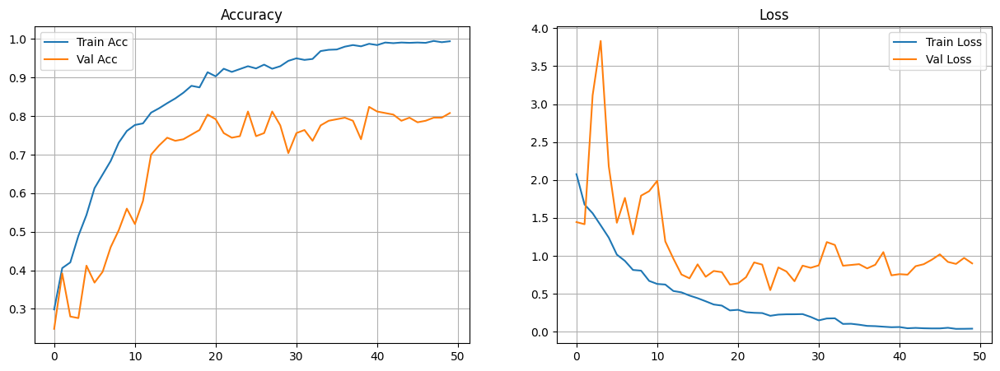


Evaluating...
Test Loss: 0.3033
Test Accuracy: 0.8984
Test Loss: 0.5478
Test Accuracy: 0.8120
Test Loss: 0.5676
Test Accuracy: 0.8179

Confusion Matrices...


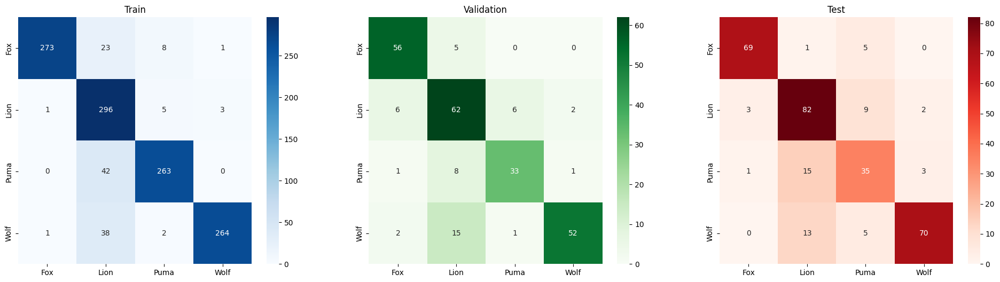


Classification Reports...



=== TRAIN CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       0.99      0.90      0.94       305
        Lion       0.74      0.97      0.84       305
        Puma       0.95      0.86      0.90       305
        Wolf       0.99      0.87      0.92       305

    accuracy                           0.90      1220
   macro avg       0.92      0.90      0.90      1220
weighted avg       0.92      0.90      0.90      1220


=== VALIDATION CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       0.86      0.92      0.89        61
        Lion       0.69      0.82      0.75        76
        Puma       0.82      0.77      0.80        43
        Wolf       0.95      0.74      0.83        70

    accuracy                           0.81       250
   macro avg       0.83      0.81      0.82       250
weighted avg       0.83      0.81      0.81       250


=== TEST CLASSIFICATION REPORT ===
              p

In [3]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.applications import DenseNet121
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import os
from sklearn.utils.class_weight import compute_class_weight


# ================================================================
# ABLATION PARAMETERS — CHANGE THESE ONLY FOR EXPERIMENTS
# ================================================================
ABLATION_CONFIG = {
    "learning_rate": 5e-4,     # Try values: 1e-3, 5e-4, 1e-4, 1e-5
    "batch_size": 32,            # Try values: 16, 32, 64
    "dropout_1": 0.5,            # First classifier dropout
    "dropout_2": 0.4,            # Second classifier dropout
    "dropout_3": 0.3             # Third classifier dropout
}
# ================================================================



class DenseNet121SpectrogramClassifier:
    def __init__(self, input_shape, num_classes, use_imagenet_weights=True, freeze_base=False):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.use_imagenet_weights = use_imagenet_weights
        self.freeze_base = freeze_base
        self.model = None
        self.history = None
        self.class_weights = None
        
    def build_model(self):
        inputs = keras.Input(shape=self.input_shape)

        # Data Augmentation
        x = layers.RandomRotation(0.1, fill_mode='constant')(inputs)
        x = layers.RandomZoom(0.1, fill_mode='constant')(x)
        x = layers.RandomContrast(0.1)(x)
        x = layers.GaussianNoise(0.01)(x)

        # Convert grayscale → 3-channel for DenseNet
        if self.input_shape[-1] == 1:
            x = layers.Conv2D(3, (1, 1), padding='same', activation=None)(x)

        weights = 'imagenet' if self.use_imagenet_weights else None

        base_model = DenseNet121(
            include_top=False,
            weights=weights,
            input_tensor=x,
            pooling='avg'
        )
        base_model.trainable = not self.freeze_base

        x = base_model.output

        # ======================================================================================
        # ABLATION PARAMETERS: Dropout rates plugged in here
        # ======================================================================================
        d1 = ABLATION_CONFIG["dropout_1"]
        d2 = ABLATION_CONFIG["dropout_2"]
        d3 = ABLATION_CONFIG["dropout_3"]
        # ======================================================================================

        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d1)(x)

        x = layers.Dense(256, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d2)(x)

        x = layers.Dense(128, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d3)(x)

        outputs = layers.Dense(self.num_classes, activation='softmax', dtype='float32')(x)

        self.model = keras.Model(inputs=inputs, outputs=outputs)
        return self.model
    
    def compile_model(self, learning_rate=None):
        if self.model is None:
            self.build_model()

        # ======================================================================================
        # ABLATION PARAMETER: Learning rate
        # ======================================================================================
        lr = learning_rate if learning_rate is not None else ABLATION_CONFIG["learning_rate"]
        # ======================================================================================

        optimizer = keras.optimizers.Adam(
            learning_rate=lr, 
            clipnorm=1.0
        )
        
        self.model.compile(
            optimizer=optimizer,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
    
    def compute_class_weights(self, y_train):
        self.class_weights = compute_class_weight(
            'balanced',
            classes=np.unique(y_train),
            y=y_train
        )
        self.class_weights = dict(enumerate(self.class_weights))
        return self.class_weights
    
    def train(self, X_train, y_train, X_val, y_val, epochs=100, batch_size=None):

        # ======================================================================================
        # ABLATION PARAMETER: Batch size
        # ======================================================================================
        if batch_size is None:
            batch_size = ABLATION_CONFIG["batch_size"]
        # ======================================================================================

        if len(y_train.shape) > 1 and y_train.shape[1] > 1:
            y_train = np.argmax(y_train, axis=1)
        if len(y_val.shape) > 1 and y_val.shape[1] > 1:
            y_val = np.argmax(y_val, axis=1)

        X_train = X_train.astype('float32')
        X_val = X_val.astype('float32')

        if self.class_weights is None:
            self.compute_class_weights(y_train)

        callbacks_list = [
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=25,
                restore_best_weights=True,
                min_delta=0.001,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=8,
                min_lr=1e-7,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                'best_densenet121_spectrogram_v2.h5',
                monitor='val_accuracy',
                save_best_only=True,
                mode='max',
                verbose=1
            )
        ]

        self.history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=self.class_weights,
            verbose=1
        )
        
        return self.history
    
    def evaluate(self, X_test, y_test):
        if len(y_test.shape) > 1 and y_test.shape[1] > 1:
            y_test = np.argmax(y_test, axis=1)

        X_test = X_test.astype('float32')
        y_test = y_test.astype('int32')

        results = self.model.evaluate(X_test, y_test, verbose=0)
        print(f"Test Loss: {results[0]:.4f}")
        print(f"Test Accuracy: {results[1]:.4f}")
        return results[0], results[1]
    
    def predict(self, X):
        X = X.astype('float32')
        preds = self.model.predict(X)
        return np.argmax(preds, axis=1), preds



# ======================================================
# DATA LOADING (unchanged)
# ======================================================
def load_preprocessed_data(data_path="/kaggle/input/dl-final-dataset"):
    try:
        X_train = np.load(os.path.join(data_path, 'X_train.npy'))
        X_val = np.load(os.path.join(data_path, 'X_val.npy'))
        X_test = np.load(os.path.join(data_path, 'X_test.npy'))

        with open(os.path.join(data_path, 'y_train.pkl'), 'rb') as f:
            y_train = pickle.load(f)
        with open(os.path.join(data_path, 'y_val.pkl'), 'rb') as f:
            y_val = pickle.load(f)
        with open(os.path.join(data_path, 'y_test.pkl'), 'rb') as f:
            y_test = pickle.load(f)

        with open(os.path.join(data_path, 'class_names.pkl'), 'rb') as f:
            class_names = pickle.load(f)

        return (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names
    
    except Exception as e:
        print(f"ERROR loading data: {e}")
        return None, None, None, None




# ======================================================
# VISUALIZATION / ANALYSIS FUNCTIONS (unchanged)
# ======================================================
def plot_training_history(history):
    fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, 5))
    a1.plot(history.history['accuracy'], label='Train Acc')
    a1.plot(history.history['val_accuracy'], label='Val Acc')
    a1.legend()
    a1.set_title("Accuracy")
    a1.grid(True)

    a2.plot(history.history['loss'], label='Train Loss')
    a2.plot(history.history['val_loss'], label='Val Loss')
    a2.legend()
    a2.set_title("Loss")
    a2.grid(True)
    plt.show()


def plot_comprehensive_confusion_matrices(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train, X_val, X_test = X_train.astype('float32'), X_val.astype('float32'), X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    cm_train = confusion_matrix(y_train, p_train)
    cm_val = confusion_matrix(y_val, p_val)
    cm_test = confusion_matrix(y_test, p_test)

    fig, ax = plt.subplots(1, 3, figsize=(24, 6))
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=ax[0], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_val, annot=True, fmt='d', cmap='Greens', ax=ax[1], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Reds', ax=ax[2], xticklabels=class_names, yticklabels=class_names)
    ax[0].set_title("Train")
    ax[1].set_title("Validation")
    ax[2].set_title("Test")
    plt.show()

    return cm_train, cm_val, cm_test




def print_comprehensive_classification_reports(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train = X_train.astype('float32')
    X_val = X_val.astype('float32')
    X_test = X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    print("\n=== TRAIN CLASSIFICATION REPORT ===")
    print(classification_report(y_train, p_train, target_names=class_names))

    print("\n=== VALIDATION CLASSIFICATION REPORT ===")
    print(classification_report(y_val, p_val, target_names=class_names))

    print("\n=== TEST CLASSIFICATION REPORT ===")
    print(classification_report(y_test, p_test, target_names=class_names))



def plot_sample_predictions(model, X_test, y_test, class_names, num_samples=12):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    idxs = np.random.choice(len(X_test), min(num_samples, len(X_test)), replace=False)
    fig, axes = plt.subplots(3, 4, figsize=(15, 12))

    axes = axes.ravel()
    for i, idx in enumerate(idxs):
        axes[i].imshow(X_test[idx][:, :, 0] if X_test[idx].shape[-1] == 1 else X_test[idx], cmap='viridis')
        axes[i].set_title(
            f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}\nConf: {conf[idx]:.3f}",
            color="green" if y_pred[idx] == y_true[idx] else "red"
        )
        axes[i].axis('off')
    plt.show()



def analyze_misclassifications(model, X_test, y_test, class_names, top_k=10):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    wrong = np.where(y_pred != y_true)[0]
    wrong_conf = conf[wrong]

    if len(wrong) == 0:
        print("No misclassifications!")
        return

    top_wrong = wrong[np.argsort(wrong_conf)[-top_k:]]

    print("\nTop Confident Misclassifications:")
    for idx in top_wrong:
        print(f"True: {class_names[y_true[idx]]:<12} Pred: {class_names[y_pred[idx]]:<12} Conf: {conf[idx]:.4f}")



# ======================================================
# MAIN PIPELINE
# ======================================================
def main():

    DATA_PATH = "/kaggle/input/dl-final-dataset"
    EPOCHS = 100

    print("Loading dataset...")
    (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names = load_preprocessed_data(DATA_PATH)

    if X_train is None:
        print("DATA NOT FOUND — EXITING")
        return

    print("\nDataset Loaded!")
    print(f"Train: {X_train.shape}, Val: {X_val.shape}, Test: {X_test.shape}")
    print(f"Classes: {class_names}")

    # Convert string labels → numbers
    if isinstance(y_train[0], str):
        mapping = {c:i for i,c in enumerate(class_names)}
        y_train = np.array([mapping[y] for y in y_train])
        y_val = np.array([mapping[y] for y in y_val])
        y_test = np.array([mapping[y] for y in y_test])

    print("\nBuilding DenseNet model...")
    model_obj = DenseNet121SpectrogramClassifier(
        input_shape=X_train[0].shape,
        num_classes=len(class_names)
    )

    model_obj.compile_model()
    model_obj.model.summary()

    print("\nTraining model...")
    history = model_obj.train(
        X_train, y_train,
        X_val, y_val,
        epochs=EPOCHS
    )

    print("\nPlotting training curves...")
    plot_training_history(history)

    print("\nEvaluating performance...")
    model_obj.evaluate(X_train, y_train)
    model_obj.evaluate(X_val, y_val)
    model_obj.evaluate(X_test, y_test)

    print("\nGenerating confusion matrices...")
    plot_comprehensive_confusion_matrices(
        model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )

    print("\nClassification reports...")
    print_comprehensive_classification_reports(
        model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )

    print("\nSample predictions...")
    plot_sample_predictions(model_obj.model, X_test, y_test, class_names)

    print("\nAnalyzing misclassifications...")
    analyze_misclassifications(model_obj.model, X_test, y_test, class_names)

    print("\nSaving final model...")
    model_obj.model.save("densenet121_spectrogram_final_model_v2.h5")
    print("Saved: densenet121_spectrogram_final_model_v2.h5")

    print("Saving label mapping...")
    mapping = {i: c for i, c in enumerate(class_names)}
    with open("label_mapping_v2.pkl", "wb") as f:
        pickle.dump(mapping, f)
    print("Saved: label_mapping_v2.pkl")


if __name__ == "__main__":
    np.random.seed(42)
    tf.random.set_seed(42)

    main()


Loading dataset...

Dataset Loaded!
Train: (1220, 224, 224, 3), Val: (250, 224, 224, 3), Test: (313, 224, 224, 3)
Classes: ['Fox', 'Lion', 'Puma', 'Wolf']

Building DenseNet model...


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_rotation_3   │ (None, 224, 224,  │          0 │ input_layer_3[0]… │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_zoom_3       │ (None, 224, 224,  │          0 │ random_rotation_… │
│ (RandomZoom)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast_3   │ (None, 224, 224,  │          0 │ random_zoom_3[0]… │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_3    │ (None, 224, 224,  │          0 │ random_contrast_… │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_6    │ (None, 230, 230,  │          0 │ gaussian_noise_3… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_6… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_7    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_7… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r

 Total params: 7,730,628 (29.49 MB)

 Trainable params: 7,645,188 (29.16 MB)

 Non-trainable params: 85,440 (333.75 KB)


Training model...
Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.3893 - loss: 1.7101
Epoch 1: val_accuracy improved from -inf to 0.32000, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.3921 - loss: 1.7010 - val_accuracy: 0.3200 - val_loss: 1.4562 - learning_rate: 5.0000e-04
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - accuracy: 0.6422 - loss: 1.0200
Epoch 2: val_accuracy did not improve from 0.32000
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 755ms/step - accuracy: 0.6421 - loss: 1.0181 - val_accuracy: 0.2840 - val_loss: 1.4079 - learning_rate: 5.0000e-04
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.7021 - loss: 0.8526
Epoch 3: val_accuracy did not improve from 0.32000
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 743ms/step - accuracy: 0.7023 - loss: 0.8504 - val_accuracy: 0.3000 - val_loss: 1.7026 - learning_rate: 5.0000e-04
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.7489 - loss: 0.6512
Epoch 4: val_accuracy improved from 0.32000 to 0.36000, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 809ms/step - accuracy: 0.7489 - loss: 0.6525 - val_accuracy: 0.3600 - val_loss: 2.5129 - learning_rate: 5.0000e-04
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.7902 - loss: 0.5522
Epoch 5: val_accuracy improved from 0.36000 to 0.44400, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 812ms/step - accuracy: 0.7905 - loss: 0.5529 - val_accuracy: 0.4440 - val_loss: 1.9365 - learning_rate: 5.0000e-04
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.8243 - loss: 0.4663
Epoch 6: val_accuracy did not improve from 0.44400
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 744ms/step - accuracy: 0.8243 - loss: 0.4658 - val_accuracy: 0.4080 - val_loss: 2.4220 - learning_rate: 5.0000e-04
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.8643 - loss: 0.3870
Epoch 7: val_accuracy improved from 0.44400 to 0.58000, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 812ms/step - accuracy: 0.8634 - loss: 0.3885 - val_accuracy: 0.5800 - val_loss: 1.6304 - learning_rate: 5.0000e-04
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.8772 - loss: 0.3382
Epoch 8: val_accuracy did not improve from 0.58000
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 745ms/step - accuracy: 0.8766 - loss: 0.3396 - val_accuracy: 0.5040 - val_loss: 3.0062 - learning_rate: 5.0000e-04
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.9024 - loss: 0.3059
Epoch 9: val_accuracy improved from 0.58000 to 0.60000, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 811ms/step - accuracy: 0.9012 - loss: 0.3072 - val_accuracy: 0.6000 - val_loss: 2.5680 - learning_rate: 5.0000e-04
Epoch 10/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.8962 - loss: 0.3067
Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 10: val_accuracy improved from 0.60000 to 0.69200, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 811ms/step - accuracy: 0.8954 - loss: 0.3084 - val_accuracy: 0.6920 - val_loss: 1.6108 - learning_rate: 5.0000e-04
Epoch 11/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.8892 - loss: 0.3334
Epoch 11: val_accuracy improved from 0.69200 to 0.73200, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 823ms/step - accuracy: 0.8891 - loss: 0.3328 - val_accuracy: 0.7320 - val_loss: 1.1046 - learning_rate: 2.5000e-04
Epoch 12/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.9412 - loss: 0.1782
Epoch 12: val_accuracy did not improve from 0.73200
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 743ms/step - accuracy: 0.9408 - loss: 0.1795 - val_accuracy: 0.6200 - val_loss: 1.4554 - learning_rate: 2.5000e-04
Epoch 13/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - accuracy: 0.9478 - loss: 0.1422
Epoch 13: val_accuracy did not improve from 0.73200
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 745ms/step - accuracy: 0.9475 - loss: 0.1432 - val_accuracy: 0.6120 - val_loss: 1.4515 - learning_rate: 2.5000e-04
Epoch 14/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - accuracy: 0.9471 - loss: 0.1449
Epoch 14: val_accuracy did not improve from 0.73200
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 746ms/step - accuracy: 0.9465 - loss: 0.1462 - val_accuracy: 0.6120 - val_loss: 1.6095 - learning_rate: 2.5000e

20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 820ms/step - accuracy: 0.9702 - loss: 0.0885 - val_accuracy: 0.7360 - val_loss: 0.9586 - learning_rate: 2.5000e-04
Epoch 20/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.9764 - loss: 0.0779
Epoch 20: val_accuracy did not improve from 0.73600
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 746ms/step - accuracy: 0.9762 - loss: 0.0783 - val_accuracy: 0.7000 - val_loss: 1.0698 - learning_rate: 2.5000e-04
Epoch 21/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - accuracy: 0.9792 - loss: 0.0564
Epoch 21: val_accuracy did not improve from 0.73600
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 744ms/step - accuracy: 0.9792 - loss: 0.0568 - val_accuracy: 0.7280 - val_loss: 0.9662 - learning_rate: 2.5000e-04
Epoch 22/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - accuracy: 0.9820 - loss: 0.0592
Epoch 22: val_accuracy improved from 0.73600 to 0.78800, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 821ms/step - accuracy: 0.9820 - loss: 0.0593 - val_accuracy: 0.7880 - val_loss: 0.7770 - learning_rate: 2.5000e-04
Epoch 23/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.9836 - loss: 0.0503
Epoch 23: val_accuracy did not improve from 0.78800
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 746ms/step - accuracy: 0.9836 - loss: 0.0505 - val_accuracy: 0.7400 - val_loss: 0.9771 - learning_rate: 2.5000e-04
Epoch 24/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.9840 - loss: 0.0591
Epoch 24: val_accuracy did not improve from 0.78800
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 746ms/step - accuracy: 0.9839 - loss: 0.0591 - val_accuracy: 0.7840 - val_loss: 1.0142 - learning_rate: 2.5000e-04
Epoch 25/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - accuracy: 0.9835 - loss: 0.0502
Epoch 25: val_accuracy did not improve from 0.78800
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 743ms/step - accuracy: 0.9836 - loss: 0.0503 - val_accuracy: 0.7560 - val_loss: 1.3560 - learning_rate: 2.5000e

20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 812ms/step - accuracy: 0.9967 - loss: 0.0185 - val_accuracy: 0.7960 - val_loss: 0.8614 - learning_rate: 1.2500e-04
Epoch 33/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - accuracy: 0.9982 - loss: 0.0128
Epoch 33: val_accuracy did not improve from 0.79600
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 755ms/step - accuracy: 0.9982 - loss: 0.0128 - val_accuracy: 0.7960 - val_loss: 0.7756 - learning_rate: 1.2500e-04
Epoch 34/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.9977 - loss: 0.0112
Epoch 34: val_accuracy improved from 0.79600 to 0.80400, saving model to best_densenet121_spectrogram_v2.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 820ms/step - accuracy: 0.9976 - loss: 0.0113 - val_accuracy: 0.8040 - val_loss: 0.7372 - learning_rate: 1.2500e-04
Epoch 35/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.9986 - loss: 0.0094
Epoch 35: val_accuracy did not improve from 0.80400
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 756ms/step - accuracy: 0.9985 - loss: 0.0096 - val_accuracy: 0.8000 - val_loss: 0.7350 - learning_rate: 1.2500e-04
Epoch 36/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.9972 - loss: 0.0083
Epoch 36: val_accuracy did not improve from 0.80400
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 744ms/step - accuracy: 0.9972 - loss: 0.0085 - val_accuracy: 0.8040 - val_loss: 0.7372 - learning_rate: 1.2500e-04
Epoch 37/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 708ms/step - accuracy: 0.9958 - loss: 0.0195
Epoch 37: val_accuracy did not improve from 0.80400
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 744ms/step - accuracy: 0.9958 - loss: 0.0195 - val_accuracy: 0.7920 - val_loss: 0.8478 - learning_rate: 1.2500e

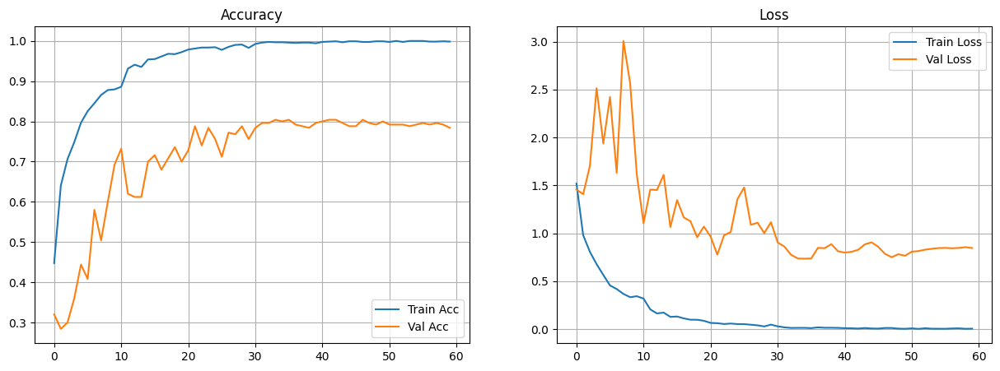


Evaluating performance...
Test Loss: 0.0147
Test Accuracy: 0.9959
Test Loss: 0.7350
Test Accuracy: 0.8000
Test Loss: 0.7309
Test Accuracy: 0.8179

Generating confusion matrices...


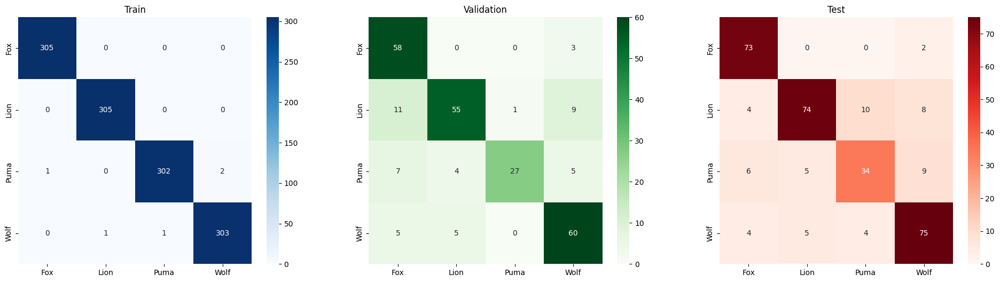


Classification reports...

=== TRAIN CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       1.00      1.00      1.00       305
        Lion       1.00      1.00      1.00       305
        Puma       1.00      0.99      0.99       305
        Wolf       0.99      0.99      0.99       305

    accuracy                           1.00      1220
   macro avg       1.00      1.00      1.00      1220
weighted avg       1.00      1.00      1.00      1220


=== VALIDATION CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

         Fox       0.72      0.95      0.82        61
        Lion       0.86      0.72      0.79        76
        Puma       0.96      0.63      0.76        43
        Wolf       0.78      0.86      0.82        70

    accuracy                           0.80       250
   macro avg       0.83      0.79      0.79       250
weighted avg       0.82      0.80      0.80       250


=== TEST CLASSIFICATION

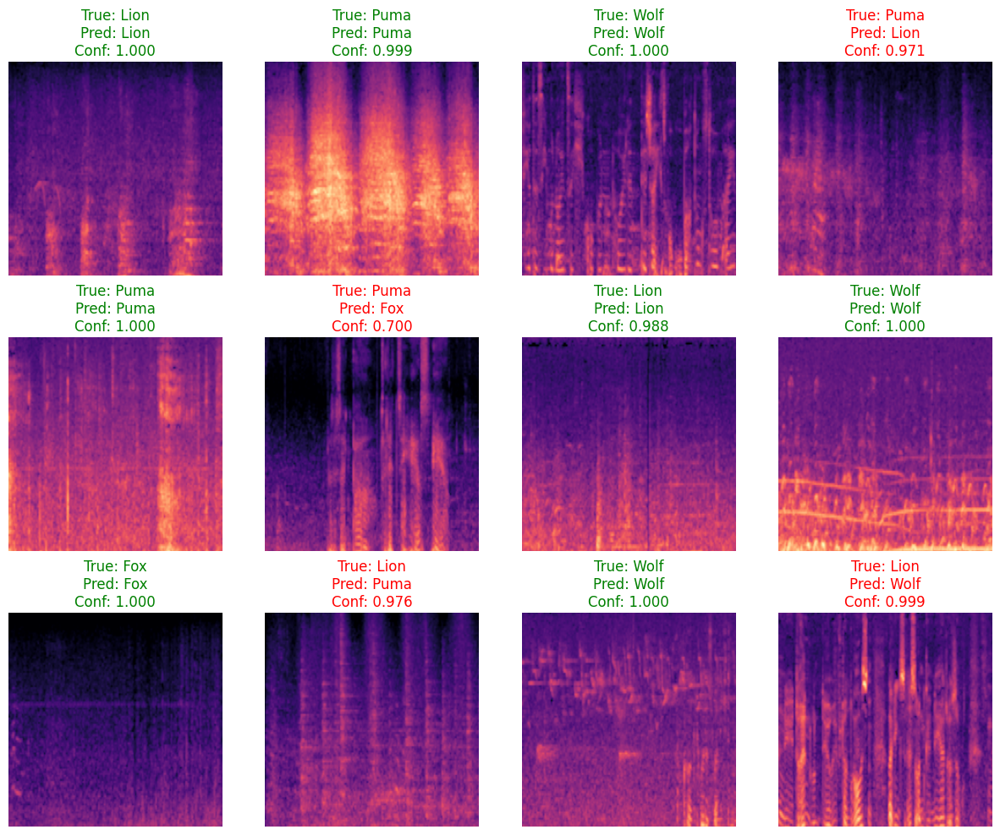


Analyzing misclassifications...



Top Confident Misclassifications:
True: Puma         Pred: Wolf         Conf: 0.9922
True: Fox          Pred: Wolf         Conf: 0.9948
True: Lion         Pred: Puma         Conf: 0.9960
True: Puma         Pred: Wolf         Conf: 0.9964
True: Wolf         Pred: Lion         Conf: 0.9966
True: Puma         Pred: Wolf         Conf: 0.9992
True: Lion         Pred: Wolf         Conf: 0.9993
True: Puma         Pred: Fox          Conf: 0.9995
True: Puma         Pred: Fox          Conf: 0.9996
True: Lion         Pred: Puma         Conf: 0.9999

Saving final model...
Saved: densenet121_spectrogram_final_model_v2.h5
Saving label mapping...
Saved: label_mapping_v2.pkl


In [4]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.applications import DenseNet121
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import os
from sklearn.utils.class_weight import compute_class_weight


# ================================================================
# ABLATION PARAMETERS — CHANGE THESE ONLY FOR EXPERIMENTS
# ================================================================
ABLATION_CONFIG = {
    "learning_rate": 5e-4,     # Try values: 1e-3, 5e-4, 1e-4, 1e-5
    "batch_size": 64,            # Try values: 16, 32, 64
    "dropout_1": 0.4,            # First classifier dropout
    "dropout_2": 0.3,            # Second classifier dropout
    "dropout_3": 0.2             # Third classifier dropout
}
# ================================================================



class DenseNet121SpectrogramClassifier:
    def __init__(self, input_shape, num_classes, use_imagenet_weights=True, freeze_base=False):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.use_imagenet_weights = use_imagenet_weights
        self.freeze_base = freeze_base
        self.model = None
        self.history = None
        self.class_weights = None
        
    def build_model(self):
        inputs = keras.Input(shape=self.input_shape)

        # Data Augmentation
        x = layers.RandomRotation(0.1, fill_mode='constant')(inputs)
        x = layers.RandomZoom(0.1, fill_mode='constant')(x)
        x = layers.RandomContrast(0.1)(x)
        x = layers.GaussianNoise(0.01)(x)

        # Convert grayscale → 3-channel for DenseNet
        if self.input_shape[-1] == 1:
            x = layers.Conv2D(3, (1, 1), padding='same', activation=None)(x)

        weights = 'imagenet' if self.use_imagenet_weights else None

        base_model = DenseNet121(
            include_top=False,
            weights=weights,
            input_tensor=x,
            pooling='avg'
        )
        base_model.trainable = not self.freeze_base

        x = base_model.output

        # ======================================================================================
        # ABLATION PARAMETERS: Dropout rates plugged in here
        # ======================================================================================
        d1 = ABLATION_CONFIG["dropout_1"]
        d2 = ABLATION_CONFIG["dropout_2"]
        d3 = ABLATION_CONFIG["dropout_3"]
        # ======================================================================================

        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d1)(x)

        x = layers.Dense(256, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d2)(x)

        x = layers.Dense(128, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(d3)(x)

        outputs = layers.Dense(self.num_classes, activation='softmax', dtype='float32')(x)

        self.model = keras.Model(inputs=inputs, outputs=outputs)
        return self.model
    
    def compile_model(self, learning_rate=None):
        if self.model is None:
            self.build_model()

        # ======================================================================================
        # ABLATION PARAMETER: Learning rate
        # ======================================================================================
        lr = learning_rate if learning_rate is not None else ABLATION_CONFIG["learning_rate"]
        # ======================================================================================

        optimizer = keras.optimizers.Adam(
            learning_rate=lr, 
            clipnorm=1.0
        )
        
        self.model.compile(
            optimizer=optimizer,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
    
    def compute_class_weights(self, y_train):
        self.class_weights = compute_class_weight(
            'balanced',
            classes=np.unique(y_train),
            y=y_train
        )
        self.class_weights = dict(enumerate(self.class_weights))
        return self.class_weights
    
    def train(self, X_train, y_train, X_val, y_val, epochs=100, batch_size=None):

        # ======================================================================================
        # ABLATION PARAMETER: Batch size
        # ======================================================================================
        if batch_size is None:
            batch_size = ABLATION_CONFIG["batch_size"]
        # ======================================================================================

        if len(y_train.shape) > 1 and y_train.shape[1] > 1:
            y_train = np.argmax(y_train, axis=1)
        if len(y_val.shape) > 1 and y_val.shape[1] > 1:
            y_val = np.argmax(y_val, axis=1)

        X_train = X_train.astype('float32')
        X_val = X_val.astype('float32')

        if self.class_weights is None:
            self.compute_class_weights(y_train)

        callbacks_list = [
            callbacks.EarlyStopping(
                monitor='val_loss',
                patience=25,
                restore_best_weights=True,
                min_delta=0.001,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=8,
                min_lr=1e-7,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                'best_densenet121_spectrogram_v2.h5',
                monitor='val_accuracy',
                save_best_only=True,
                mode='max',
                verbose=1
            )
        ]

        self.history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=self.class_weights,
            verbose=1
        )
        
        return self.history
    
    def evaluate(self, X_test, y_test):
        if len(y_test.shape) > 1 and y_test.shape[1] > 1:
            y_test = np.argmax(y_test, axis=1)

        X_test = X_test.astype('float32')
        y_test = y_test.astype('int32')

        results = self.model.evaluate(X_test, y_test, verbose=0)
        print(f"Test Loss: {results[0]:.4f}")
        print(f"Test Accuracy: {results[1]:.4f}")
        return results[0], results[1]
    
    def predict(self, X):
        X = X.astype('float32')
        preds = self.model.predict(X)
        return np.argmax(preds, axis=1), preds



# ======================================================
# DATA LOADING (unchanged)
# ======================================================
def load_preprocessed_data(data_path="/kaggle/input/dl-final-dataset"):
    try:
        X_train = np.load(os.path.join(data_path, 'X_train.npy'))
        X_val = np.load(os.path.join(data_path, 'X_val.npy'))
        X_test = np.load(os.path.join(data_path, 'X_test.npy'))

        with open(os.path.join(data_path, 'y_train.pkl'), 'rb') as f:
            y_train = pickle.load(f)
        with open(os.path.join(data_path, 'y_val.pkl'), 'rb') as f:
            y_val = pickle.load(f)
        with open(os.path.join(data_path, 'y_test.pkl'), 'rb') as f:
            y_test = pickle.load(f)

        with open(os.path.join(data_path, 'class_names.pkl'), 'rb') as f:
            class_names = pickle.load(f)

        return (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names
    
    except Exception as e:
        print(f"ERROR loading data: {e}")
        return None, None, None, None




# ======================================================
# VISUALIZATION / ANALYSIS FUNCTIONS (unchanged)
# ======================================================
def plot_training_history(history):
    fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, 5))
    a1.plot(history.history['accuracy'], label='Train Acc')
    a1.plot(history.history['val_accuracy'], label='Val Acc')
    a1.legend()
    a1.set_title("Accuracy")
    a1.grid(True)

    a2.plot(history.history['loss'], label='Train Loss')
    a2.plot(history.history['val_loss'], label='Val Loss')
    a2.legend()
    a2.set_title("Loss")
    a2.grid(True)
    plt.show()


def plot_comprehensive_confusion_matrices(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train, X_val, X_test = X_train.astype('float32'), X_val.astype('float32'), X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    cm_train = confusion_matrix(y_train, p_train)
    cm_val = confusion_matrix(y_val, p_val)
    cm_test = confusion_matrix(y_test, p_test)

    fig, ax = plt.subplots(1, 3, figsize=(24, 6))
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=ax[0], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_val, annot=True, fmt='d', cmap='Greens', ax=ax[1], xticklabels=class_names, yticklabels=class_names)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Reds', ax=ax[2], xticklabels=class_names, yticklabels=class_names)
    ax[0].set_title("Train")
    ax[1].set_title("Validation")
    ax[2].set_title("Test")
    plt.show()

    return cm_train, cm_val, cm_test




def print_comprehensive_classification_reports(model, X_train, y_train, X_val, y_val, X_test, y_test, class_names):
    X_train = X_train.astype('float32')
    X_val = X_val.astype('float32')
    X_test = X_test.astype('float32')

    p_train = np.argmax(model.predict(X_train, verbose=0), axis=1)
    p_val = np.argmax(model.predict(X_val, verbose=0), axis=1)
    p_test = np.argmax(model.predict(X_test, verbose=0), axis=1)

    y_train = y_train if y_train.ndim == 1 else np.argmax(y_train, axis=1)
    y_val = y_val if y_val.ndim == 1 else np.argmax(y_val, axis=1)
    y_test = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    print("\n=== TRAIN CLASSIFICATION REPORT ===")
    print(classification_report(y_train, p_train, target_names=class_names))

    print("\n=== VALIDATION CLASSIFICATION REPORT ===")
    print(classification_report(y_val, p_val, target_names=class_names))

    print("\n=== TEST CLASSIFICATION REPORT ===")
    print(classification_report(y_test, p_test, target_names=class_names))



def plot_sample_predictions(model, X_test, y_test, class_names, num_samples=12):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    idxs = np.random.choice(len(X_test), min(num_samples, len(X_test)), replace=False)
    fig, axes = plt.subplots(3, 4, figsize=(15, 12))

    axes = axes.ravel()
    for i, idx in enumerate(idxs):
        axes[i].imshow(X_test[idx][:, :, 0] if X_test[idx].shape[-1] == 1 else X_test[idx], cmap='viridis')
        axes[i].set_title(
            f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}\nConf: {conf[idx]:.3f}",
            color="green" if y_pred[idx] == y_true[idx] else "red"
        )
        axes[i].axis('off')
    plt.show()



def analyze_misclassifications(model, X_test, y_test, class_names, top_k=10):
    X_test = X_test.astype('float32')
    preds = model.predict(X_test, verbose=0)

    y_pred = np.argmax(preds, axis=1)
    conf = np.max(preds, axis=1)

    y_true = y_test if y_test.ndim == 1 else np.argmax(y_test, axis=1)

    wrong = np.where(y_pred != y_true)[0]
    wrong_conf = conf[wrong]

    if len(wrong) == 0:
        print("No misclassifications!")
        return

    top_wrong = wrong[np.argsort(wrong_conf)[-top_k:]]

    print("\nTop Confident Misclassifications:")
    for idx in top_wrong:
        print(f"True: {class_names[y_true[idx]]:<12} Pred: {class_names[y_pred[idx]]:<12} Conf: {conf[idx]:.4f}")



# ======================================================
# MAIN PIPELINE
# ======================================================
def main():

    DATA_PATH = "/kaggle/input/dl-final-dataset"
    EPOCHS = 100

    print("Loading dataset...")
    (X_train, y_train), (X_val, y_val), (X_test, y_test), class_names = load_preprocessed_data(DATA_PATH)

    if X_train is None:
        print("DATA NOT FOUND — EXITING")
        return

    print("\nDataset Loaded!")
    print(f"Train: {X_train.shape}, Val: {X_val.shape}, Test: {X_test.shape}")
    print(f"Classes: {class_names}")

    # Convert string labels → numbers
    if isinstance(y_train[0], str):
        mapping = {c:i for i,c in enumerate(class_names)}
        y_train = np.array([mapping[y] for y in y_train])
        y_val = np.array([mapping[y] for y in y_val])
        y_test = np.array([mapping[y] for y in y_test])

    print("\nBuilding DenseNet model...")
    model_obj = DenseNet121SpectrogramClassifier(
        input_shape=X_train[0].shape,
        num_classes=len(class_names)
    )

    model_obj.compile_model()
    model_obj.model.summary()

    print("\nTraining model...")
    history = model_obj.train(
        X_train, y_train,
        X_val, y_val,
        epochs=EPOCHS
    )

    print("\nPlotting training curves...")
    plot_training_history(history)

    print("\nEvaluating performance...")
    model_obj.evaluate(X_train, y_train)
    model_obj.evaluate(X_val, y_val)
    model_obj.evaluate(X_test, y_test)

    print("\nGenerating confusion matrices...")
    plot_comprehensive_confusion_matrices(
        model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )

    print("\nClassification reports...")
    print_comprehensive_classification_reports(
        model_obj.model, X_train, y_train, X_val, y_val, X_test, y_test, class_names
    )

    print("\nSample predictions...")
    plot_sample_predictions(model_obj.model, X_test, y_test, class_names)

    print("\nAnalyzing misclassifications...")
    analyze_misclassifications(model_obj.model, X_test, y_test, class_names)

    print("\nSaving final model...")
    model_obj.model.save("densenet121_spectrogram_final_model_v2.h5")
    print("Saved: densenet121_spectrogram_final_model_v2.h5")

    print("Saving label mapping...")
    mapping = {i: c for i, c in enumerate(class_names)}
    with open("label_mapping_v2.pkl", "wb") as f:
        pickle.dump(mapping, f)
    print("Saved: label_mapping_v2.pkl")


if __name__ == "__main__":
    np.random.seed(42)
    tf.random.set_seed(42)

    main()
